# Machine Learning model selection for Response Spectra prediction in a Crustal Tectonic environment: An AI-Driven Approach to Seismic Engineering (Versión en español)

In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import warnings
warnings.filterwarnings('ignore')

En el presente analisis exploratorio de datos se mostrará principalmente la necesidad de mezclar dos datasets distintos. En este caso se habla de los datasets de NGA West 2 que contiene una gran variedad de sismos corticales (Crustal) en el mundo, y el dataset Colombiano que contiene registros sismicos corticales, de subducción y profundos de eventos sismicos ocurridos en Colombia y cercanías. <br>
Se abordará la necesidad de aumentar la variabilidad de aquella información que se tiene por ambas partes.

## Contextualización

### Magnitud y trascendencia del problema

Un sismo es el movimiento fuerte de la corteza terrestre, originado por la liberación de energía acumulada en las rocas debido a esfuerzos tectónicos, volcánicos o de otro origen. Este proceso ocurre generalmente a lo largo de fallas geológicas y su origen se ubica en el hipocentro, mientras que su proyección superficial corresponde al epicentro (USGS, 2019).

Los terremotos continúan siendo una de las amenazas naturales más devastadoras a nivel mundial, concentrando más del 56% de los eventos con víctimas y más del 90% de las muertes por colapso de edificaciones en tan solo el 9% del área terrestre del planeta (He et al., 2021).

Los sismos corticales son terremotos que ocurren en la parte más superficial de la litosfera, generalmente a profundidades menores de 60 km. Debido a su escasa profundidad, las ondas sísmicas llegan con menor atenuación a la superficie, por lo que pueden generar daños considerables incluso con magnitudes moderadas (Shearer, 2009).

En el terremoto de Popayán, Colombia (1983, Mw 5.5, profundidad ~15 km), pese a su magnitud moderada, colapsó gran parte del centro histórico y fallecieron más de 250 personas (INGEOMINAS, 1984).

El terremoto de Lorca, España (2011, Mw 5.1, profundidad ~4 km) produjo 9 muertes, más de 300 heridos y daños millonarios, demostrando la vulnerabilidad de construcciones ante eventos superficiales (Martínez-Díaz et al., 2012).

Aunque la frecuencia global no muestra un incremento sistemático, el impacto social y económico sí se ha intensificado, porque cada vez más poblaciones densas y vulnerables se ubican sobre fallas corticales activas (Bilham, 2009).

El espectro de respuesta es una representación gráfica que muestra la máxima respuesta de un oscilador de un grado de libertad, con un amortiguamiento definido, sometido a un registro sísmico. Esta herramienta permite evaluar cómo diferentes estructuras, caracterizadas por sus periodos naturales, responden frente a un mismo movimiento del suelo. De esta manera, el espectro resume en una sola curva la información dinámica contenida en un acelerograma y constituye la base para el desarrollo de los espectros de diseño en la ingeniería sísmica (Chopra, 2017).

La predicción del espectro de respuesta en sitio constituye un aspecto crítico de la ingeniería sísmica, ya que los espectros genéricos o regionales suelen presentar una gran variabilidad respecto a las condiciones locales de suelo y topografía.

### Antecedentes

Abrahamson, Silva y Kamai (2014) lograron crear un nuevo modelo de predicción de movimiento del suelo para entornos tectónicos corticales. Un GMM construido con el conjunto de datos NGA-West2, capaz de predecir desde 0.01 s hasta 10.0 s. El ASK14 obtuvo una desviación estándar de 0.65–0.85 para periodos T = 0.2 s y de 0.65–0.72 unidades logarítmicas para T = 1.0 s. Es un modelo capaz de extrapolar, pero con alta complejidad y centrado en simulaciones numéricas para la respuesta no lineal del sitio.

Por el lado de Europa, Delavaud et al. (2020) construyeron un modelo capaz de predecir los espectros de respuesta desde 0.01 s hasta 8.0 s con amortiguamiento del 5 %. El modelo, adaptable a regiones europeas, redujo la desviación estándar respecto de su predecesor. Aun así, el espectro presenta una irregularidad entre 3.5 y 4.5 s, probablemente por la pérdida de registros utilizables causada por los criterios de filtrado en frecuencia.

En Taiwán, la innovación buscó minimizar la incertidumbre de las GMPEs. Lin et al. (2021) reportaron una sigma total de 0.549, inferior a lo usual. El problema radica en la variabilidad: existe dependencia de la disponibilidad de registros cercanos; de hecho, el estudio debió ampliar el radio de 50 km a 70 km por falta de datos.

En 2023, Arteta et al. (2023) desarrollaron un GMM regionalizado basado en el ASK14 utilizando datos locales de Colombia, Ecuador y Venezuela. El modelo mantiene la capacidad de extrapolar (heredada) e incorpora una variable para atenuación adicional en trayectorias que atraviesan volcanes. Al ser un GMM puramente local, la variabilidad muestral es limitada. La desviación estándar se ubica entre 0.65 y 1.1 unidades logarítmicas.

Finalmente, en los modelos de aprendizaje automático, Alidadi y Pezeshk (2025) exploraron varias técnicas y discutieron ventajas y desafíos de su aplicación en ingeniería sísmica.

### Acerca del proyecto 

La investigación realizada es muy importante porque contribuye a la correcta selección y clasificación de modelos que podrían apoyar la estimación de los espectros de respuesta cuando no existe suficiente información. Este trabajo debe ser tenido en cuenta debido a que existen muchos modelos de aprendizaje automático, y el objetivo es reducir este conjunto a aquellos que realmente puedan ayudar en la predicción en áreas donde no contamos con datos. Filtrar los modelos ahorrará tiempo a futuros investigadores en el campo de la inteligencia artificial aplicada a la ingeniería sísmica, y además permitirá una mejor comprensión de cómo funcionan estos modelos.

### Sobre los datos

El dataset NGA West 2 viene de aportes en conjunto de varias universidades y entidades. El Pacific Earthquake Engineering Research Center (PEER Center) quiso mejorar su anterior proyecto llamado Next Generation Attenuation (NGA) models. El NGA West 2 extiende el trabajo logrado en el NGA West, información que condujo a muchos avances en la estimación del riesgo sísmico. Investigadores junior y senior de PEER, estudiantes post-doctorales, de pregrado y graduados, cientificos e ingenieros sismicos trabajaron en conjunto para esta creación. <br>
Por parte del dataset colombiano fue formado y otorgado por el Servicio Geológico Colombiano (SGC), a partir de los años 1993 donde comenzaron a funcionar las estaciones sísmicas en Colombia, hasta los años 2020 hasta donde se tiene la información.<br>

## EDA NGA West2

In [89]:
df = pd.read_excel('C:/Users/elias/OneDrive/Desktop/MachineLearning/FinalProjectDL/Final_Project/Updated_NGA_West2_Flatfile_RotD50EDITADO.xlsx')
df

,Record Sequence Number,Hypocenter Latitude (deg),Hypocenter Longitude (deg),Station Latitude,Station Longitude,Hypocenter Depth (km),Earthquake Name,Magnitude,Magnitude Type,EpiD (km),...,T_0.5_RotD50,T_0.75_RotD50,T_1.0_RotD50,T_1.5_RotD50,T_2.0_RotD50,T_3.0_RotD50,T_4.0_RotD50,T_5.0_RotD50,T_6.0_RotD50,T_10.0_RotD50
0,1,46.61000,-111.96000,46.58000,-112.0300,6.000,"Helena, Montana-01",6.0,Mw,6.31000,...,0.143020,0.092829,0.101136,0.059109,0.035895,0.015257,0.007987,0.004644,0.003037,NaN
1,2,46.62000,-111.97000,46.59000,-112.0400,6.000,"Helena, Montana-02",6.0,U,6.31000,...,0.004500,0.002727,0.001501,0.001135,0.000681,NaN,NaN,NaN,NaN,NaN
2,3,40.40000,-125.10000,40.57600,-124.2630,10.000,Humbolt Bay,5.8,Mw,73.49000,...,0.082295,0.056946,0.035785,0.016157,0.009347,0.002960,NaN,NaN,NaN,NaN
3,4,32.90000,-115.21700,32.79400,-115.5490,16.000,Imperial Valley-01,5.0,U,33.20000,...,0.021552,0.009689,0.006027,0.002115,NaN,NaN,NaN,NaN,NaN,NaN
4,5,40.30000,-124.80000,40.57600,-124.2630,10.000,Northwest Calif-01,5.5,Mw,54.88000,...,0.223093,0.091499,0.093659,0.026785,0.013654,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
21293,21536,37.86037,-122.23589,37.58230,-122.4201,8.465,51177103,3.6,Mw,34.87796,...,0.001476,0.000493,0.000260,0.000114,NaN,NaN,NaN,NaN,NaN,NaN
21294,21537,37.86037,-122.23589,37.40370,-122.1760,8.465,51177103,3.6,Mw,50.96330,...,0.000350,0.000166,0.000093,0.000043,0.000016,NaN,NaN,NaN,NaN,NaN
21295,21538,37.86037,-122.23589,37.58640,-122.5022,8.465,51177103,3.6,Mw,38.41923,...,0.000883,0.000366,0.000123,0.000052,0.000032,NaN,NaN,NaN,NaN,NaN
21296,21539,37.86037,-122.23589,37.94910,-122.4085,8.465,51177103,3.6,Mw,18.09285,...,0.000810,0.000282,0.000159,0.000067,0.000032,NaN,NaN,NaN,NaN,NaN


In [90]:
df = df[df['Vs30 (m/s) selected for analysis'] > 0]

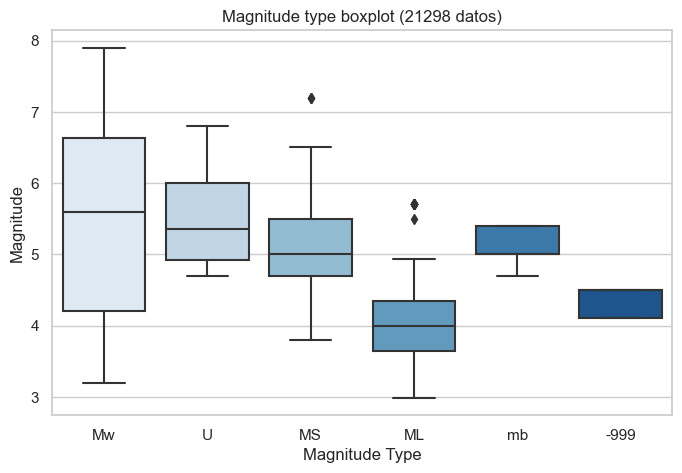

In [91]:
plt.figure(figsize=(8, 5))
sns.boxplot(x="Magnitude Type", y="Magnitude", data=df,  palette='Blues')
plt.title("Magnitude type boxplot (21298 datos)")
plt.xlabel("Magnitude Type")
plt.ylabel("Magnitude")
plt.show()

Es de vital importancia filtrar inicialmente por tipo de magnitud registrada en el dataset para garantizar uniformidad en la escala de medición. La magnitud de momento (Mw) es considerada la más confiable, ya que depende directamente de la energía liberada durante la ruptura, definida a partir del momento sísmico (Hanks & Kanamori, 1979). Por otra parte, se asume que “U” corresponde a Unknown, y “–999” indica ausencia de información. La magnitud local (ML) hace referencia a la escala de Richter, basada en la amplitud máxima de ondas registradas en un sismógrafo de periodo corto a aproximadamente 100 km del epicentro (Richter, 1935). La mb representa la magnitud de ondas de cuerpo (body waves), calculada a partir de la amplitud de ondas P, mientras que la Ms se obtiene a partir de ondas superficiales, en particular las ondas Rayleigh.

Cada escala tiene limitaciones específicas: la de Richter se satura en eventos grandes, al igual que las de body waves (mb) y surface waves (Ms), cuyos valores dejan de crecer a pesar de que la energía liberada aumenta (Lay & Wallace, 1995). En contraste, la magnitud de momento (Mw) no presenta este problema, por lo que se ha convertido en la escala estándar en sismología moderna.

![Moment_Magnitude](images/Moment_Magnitude.gif)


La magnitud de momento (Mw) se calcula a partir del momento sísmico $M_0$​ que representa la energía liberada por la ruptura. La relación entre ambos es logarítmica y se expresa:



$$
M_w = \frac{2}{3}\log_{10}(M_0) - 6.07
$$

donde $M_0 = \mu\, A\, D$.

(Hanks & Kanamori, 1979).

μ: módulo de deformación de las rocas involucradas en el evento sísmico. <br>
A: área de ruptura a lo largo de la falla geológica donde ocurrió el evento sísmico<br>
u: desplazamiento promedio de A.

Se opta por mantener solamente aquellos registros grabados con la escala de magnitud de momentos (Mw) ya que a pesar de que las demás escalas puedan ser fiables a ciertos valores de magnitud los cuales si están incluidos en sus distribuciones, es mejor evitar usarlos ya que por un lado, no se sabe de que manera fueron hechas estas mediciones con exactitud, por lo que posiblemente se estaría complementando con ruido

In [92]:
df = df[df['Magnitude Type'] == 'Mw']

In [93]:
df.drop(columns=['Record Sequence Number','Earthquake Name',
                'Magnitude Type','EpiD (km)','Joyner-Boore Dist. (km)',
                'RmsD (km)','Rx','Vs30 (m/s) selected for analysis',
                'Tmax', 'Lowest Usable Freq - Ave. Component (Hz)',
                'PGA (g)','PGV (cm/sec)','PGD (cm)'], inplace=True)

In [94]:
df

,Hypocenter Latitude (deg),Hypocenter Longitude (deg),Station Latitude,Station Longitude,Hypocenter Depth (km),Magnitude,Rhypo_OpenQuake,Rrup_OpenQuake,Soil_Class,T_0.01_RotD50,...,T_0.5_RotD50,T_0.75_RotD50,T_1.0_RotD50,T_1.5_RotD50,T_2.0_RotD50,T_3.0_RotD50,T_4.0_RotD50,T_5.0_RotD50,T_6.0_RotD50,T_10.0_RotD50
0,46.61000,-111.96000,46.58000,-112.0300,6.000,6.00,8.71000,2.86,3,0.161934,...,0.143020,0.092829,0.101136,0.059109,0.035895,0.015257,0.007987,0.004644,0.003037,NaN
2,40.40000,-125.10000,40.57600,-124.2630,10.000,5.80,74.17000,71.57,4,0.040997,...,0.082295,0.056946,0.035785,0.016157,0.009347,0.002960,NaN,NaN,NaN,NaN
4,40.30000,-124.80000,40.57600,-124.2630,10.000,5.50,55.78000,53.58,4,0.122486,...,0.223093,0.091499,0.093659,0.026785,0.013654,NaN,NaN,NaN,NaN,NaN
5,32.76010,-115.41620,32.79400,-115.5490,8.800,6.95,15.69000,6.09,4,0.234619,...,0.629952,0.435350,0.351286,0.197357,0.215745,0.106360,0.046965,NaN,NaN,NaN
10,40.28300,-124.80000,40.57600,-124.2630,10.000,5.80,56.85000,53.77,4,0.107289,...,0.172930,0.124190,0.085661,0.040947,0.019499,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
21293,37.86037,-122.23589,37.58230,-122.4201,8.465,3.60,35.89050,35.63,2,0.005176,...,0.001476,0.000493,0.000260,0.000114,NaN,NaN,NaN,NaN,NaN,NaN
21294,37.86037,-122.23589,37.40370,-122.1760,8.465,3.60,51.66153,51.36,3,0.000505,...,0.000350,0.000166,0.000093,0.000043,0.000016,NaN,NaN,NaN,NaN,NaN
21295,37.86037,-122.23589,37.58640,-122.5022,8.465,3.60,39.34073,39.13,3,0.003058,...,0.000883,0.000366,0.000123,0.000052,0.000032,NaN,NaN,NaN,NaN,NaN
21296,37.86037,-122.23589,37.94910,-122.4085,8.465,3.60,19.97517,19.44,2,0.001620,...,0.000810,0.000282,0.000159,0.000067,0.000032,NaN,NaN,NaN,NaN,NaN


In [95]:
inputs  = df.columns[0:9]
outputs = df.columns[9:31]

In [96]:
outputs

Index(['T_0.01_RotD50', 'T_0.02_RotD50', 'T_0.03_RotD50', 'T_0.04_RotD50',
       'T_0.05_RotD50', 'T_0.075_RotD50', 'T_0.1_RotD50', 'T_0.15_RotD50',
       'T_0.2_RotD50', 'T_0.25_RotD50', 'T_0.3_RotD50', 'T_0.4_RotD50',
       'T_0.5_RotD50', 'T_0.75_RotD50', 'T_1.0_RotD50', 'T_1.5_RotD50',
       'T_2.0_RotD50', 'T_3.0_RotD50', 'T_4.0_RotD50', 'T_5.0_RotD50',
       'T_6.0_RotD50', 'T_10.0_RotD50'],
      dtype='object')

Se escogen aquellos valores de periodo para aceleraciones espectrales mas representativas de las zonas al momento de graficar.

In [97]:
inputs

Index(['Hypocenter Latitude (deg)', 'Hypocenter Longitude (deg)',
       'Station Latitude', 'Station Longitude', 'Hypocenter Depth (km)',
       'Magnitude', 'Rhypo_OpenQuake', 'Rrup_OpenQuake', 'Soil_Class'],
      dtype='object')

Se escoge analizar solo aquellas variables que serán usadas para la predicción del espectro de respuesta. <br>
La razón de escogencia de estas variables en específico rige en la comparación justa entre el comportamiento de los GMPEs (Ground Motion Prediction Equations) anteriores. Estos GMPEs usados para comparar, usan laas variables de Magnitud (Magnitude), profundidad hipocentral (Hypocenter Depth (km)) , distancia de ruptura (Rrup_OpenQuake) y clase de suelo (Soil_Class). <br>
Cabe destacar que para el caso del modelo ASK14 desarrollado por Abrahamson et al 2014, usa la variable Vs30 como alternativa a la clase de suelo. Ambas variables representan lo mismo, siendo que Vs30 es continua y la clase de suelo es una clasificación discreta del Vs30.

El parámetro Vs30 corresponde a la velocidad promedio de propagación de ondas de corte (Shear Waves u ondas secundarias) en los primeros 30 metros del subsuelo.

$$
V_{S30} = \frac{30}{\sum_{i=1}^{n} \frac{h_i}{V_{Si}}}
$$

donde $h_i$ es el espesor de cada estrato y $V_{Si}$ la velocidad de onda de corte en ese estrato. Este índice se ha adoptado ampliamente en la ingeniería sísmica porque resume las condiciones del sitio y permite estimar efectos locales de amplificación de ondas sísmicas. El National Earthquake Hazards Reduction Program (NEHRP) lo utiliza como criterio estándar para la clasificación de suelos (Borcherdt, 1994; Kramer, 1996).

La variable de distancia hipocentral no será usada para predecir pero si será usada para los filtros que se harán para la preparación de los datos.

          Magnitude  Hypocenter Depth (km)  Rhypo_OpenQuake  Rrup_OpenQuake
count  12893.000000           12893.000000     12893.000000    12893.000000
mean       5.490787               9.535760       130.267442      119.121043
std        1.300414               3.883231       128.995649      113.612737
min        3.200000               0.020000         2.060000        0.050000
25%        4.200000               6.973000        49.330000       43.230000
50%        5.600000               9.000000        94.302440       86.320000
75%        6.630000              12.000000       176.600000      165.400000
max        7.900000              41.000000      1754.710000     1532.660000


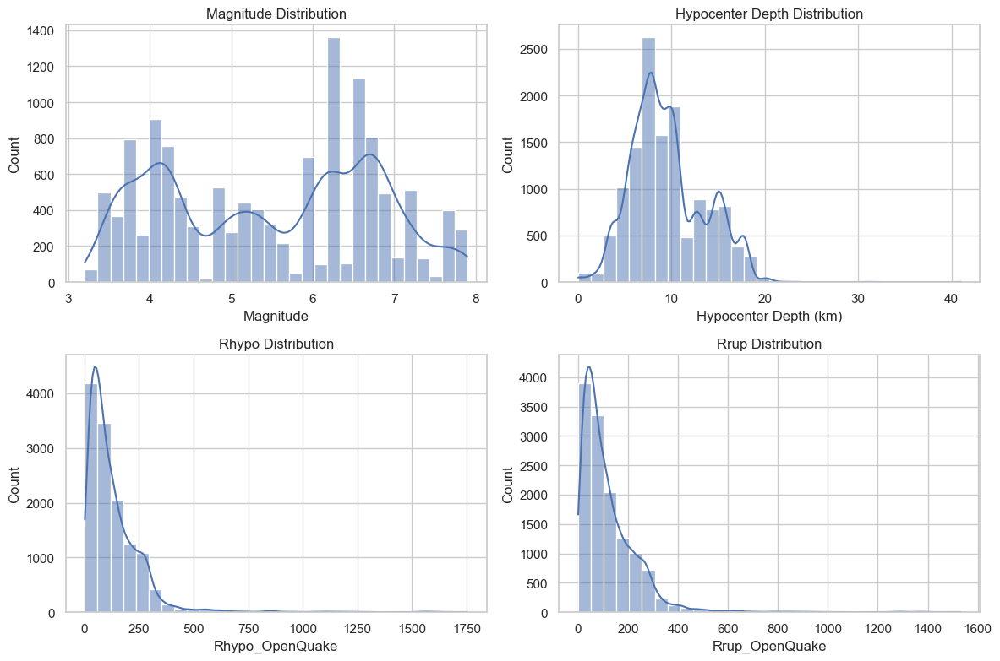

In [98]:
# Asumiendo que tu DataFrame se llama df
# 1. Descriptivos
print(df[['Magnitude', 'Hypocenter Depth (km)', 'Rhypo_OpenQuake', 'Rrup_OpenQuake']].describe())

# 2. Histogramas
fig, axes = plt.subplots(2, 2, figsize=(12, 8))
sns.histplot(df['Magnitude'], bins=30, kde=True, ax=axes[0,0])
axes[0,0].set_title("Magnitude Distribution")

sns.histplot(df['Hypocenter Depth (km)'], bins=30, kde=True, ax=axes[0,1])
axes[0,1].set_title("Hypocenter Depth Distribution")

sns.histplot(df['Rhypo_OpenQuake'], bins=30, kde=True, ax=axes[1,0])
axes[1,0].set_title("Rhypo Distribution")

sns.histplot(df['Rrup_OpenQuake'], bins=30, kde=True, ax=axes[1,1])
axes[1,1].set_title("Rrup Distribution")


plt.tight_layout()
plt.show()

Se puede evidenciar como Las distancias tienen un comportamiento muy asimétrico hacia la derecha, lo que indica que muy probablemente la transformación logarítmica podría ayudar a mejorar la distribución de los datos. <br>
Por parte de la magnitud, se ve una gran variabilidad de valores entre 3 y un poco menos a 8.

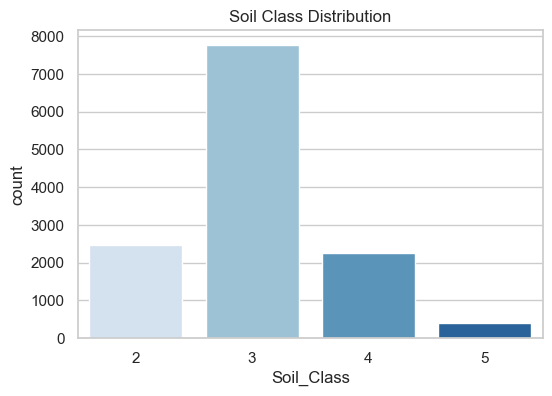

In [99]:
# 3. Soil_Class
plt.figure(figsize=(6,4))
sns.countplot(x="Soil_Class", data=df, palette='Blues')
plt.title("Soil Class Distribution")
plt.show()


Dado que la clasificación de los suelos fue hecha a partir de unos rangos de Vs30, es importante mencionar que los suelos tipo 1 (hard rock) no se pueden clasificar usando Vs30, por lo que es normal que no se tenga información sobre las clases de suelo tipo 1 para el caso del dataset de NGA West 2

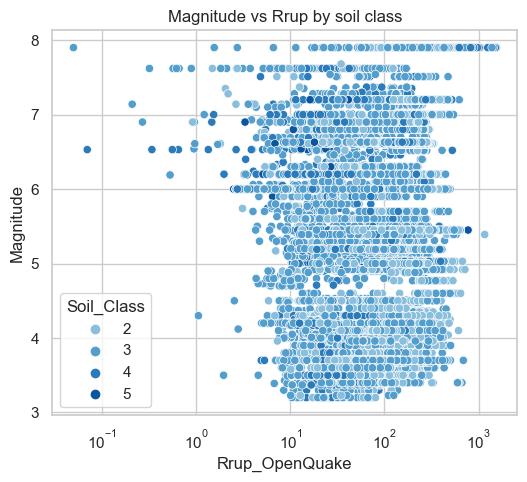

In [100]:
from matplotlib.colors import ListedColormap

# 4. Relaciones bivariadas
palette_dark_blues = sns.color_palette("Blues", n_colors=6)[2:]
plt.figure(figsize=(6,5))
sns.scatterplot(x="Rrup_OpenQuake", y="Magnitude", hue="Soil_Class", data=df,
                palette=palette_dark_blues)
plt.xscale("log")
plt.title("Magnitude vs Rrup by soil class")
plt.show()



Se puede evidenciar que el dataset de NGA WEST2 cubre gran parte de las distancias de ruptura entre los 5km y los 1000km con una variabilidad en la magnitud que a su vez se encuentra entre los valores de 3 y 8 siendo esto una buena señal ya que se tiene información sobre sismos de gran magnitud

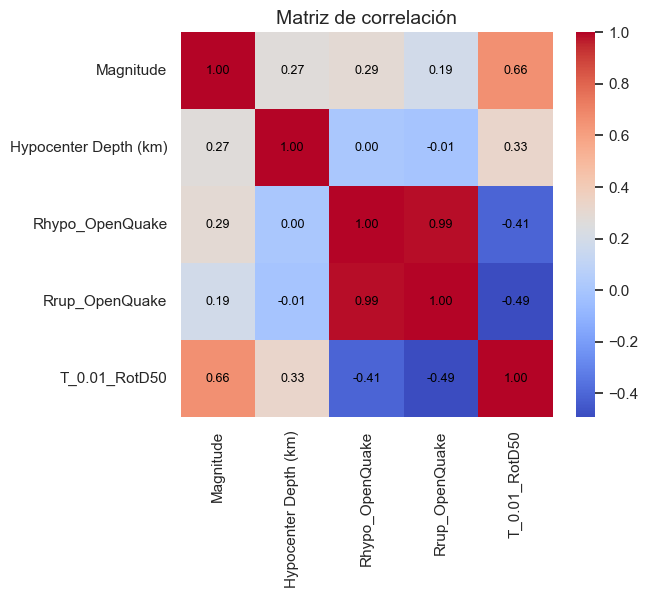

In [101]:
corr = df[['Magnitude','Hypocenter Depth (km)','Rhypo_OpenQuake','Rrup_OpenQuake','T_0.01_RotD50']].corr(method='spearman')

plt.figure(figsize=(6,5))
ax = sns.heatmap(corr, annot=False, cmap="coolwarm")

# Anotar manualmente
for i in range(len(corr)):
    for j in range(len(corr)):
        ax.text(j+0.5, i+0.5, f"{corr.iloc[i,j]:.2f}", 
                ha='center', va='center', color='black', fontsize=9)

plt.title("Matriz de correlación", fontsize=14)
plt.show()



Con correlaciones moderadas, es posible decir que una de las variables de respuesta, en este caso Sa a T=0.01s (Peak Ground Acceleration) podría ser explicada por el uso de estas variables. <br>
Luego de hacer el filtrado mencionado anteriormente usando la variable de Rhypo, es necesario eliminarla del conjunto de variables predictoras ya que por su gran correlación con Rrup podría conllevar a un overfitting de los modelos que se utilizarán.

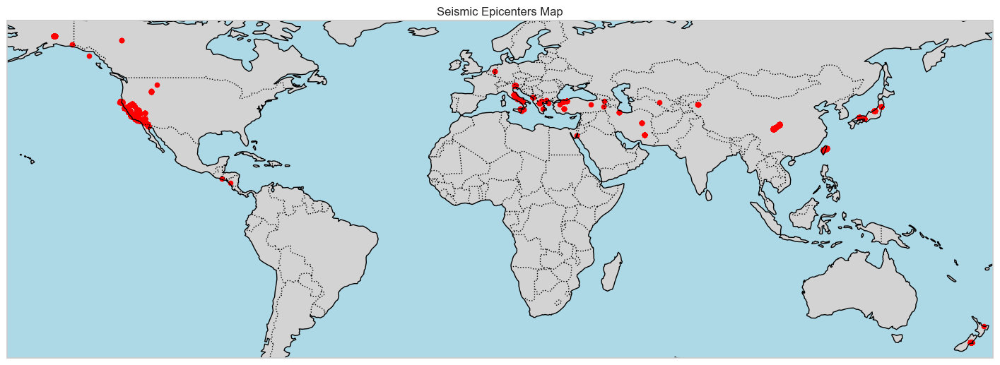

In [102]:
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cfeature

plt.figure(figsize=(18,12))
ax = plt.axes(projection=ccrs.PlateCarree())
#ax.set_extent([-85, -65, -5, 15])  # límites en grados (ej: norte de Suramérica)

ax.add_feature(cfeature.COASTLINE)
ax.add_feature(cfeature.BORDERS, linestyle=':')
ax.add_feature(cfeature.LAND, facecolor='lightgray')
ax.add_feature(cfeature.OCEAN, facecolor='lightblue')

plt.scatter(df["Hypocenter Longitude (deg)"], df["Hypocenter Latitude (deg)"], 
            c="red", s=20, transform=ccrs.PlateCarree())

plt.title("Seismic Epicenters Map")
plt.show()


En el mapa se puede evidenciar la ubicación de los sismos registrados y filtrados por tipo de magnitud en el dataset de NGA West2. <br>
Se puede observar que la mayoría de sismos registrados en el dataset se dieron en California, la región sur de Europa y parte de Asia. Sin embargo, en el dataset de NGA West2 no son los sismos exactamente lo que se muestran. Cada sismo puede aparecer mas de una vez en el registro ya que lo que realmente se toma es lo que la estación sismica registró.

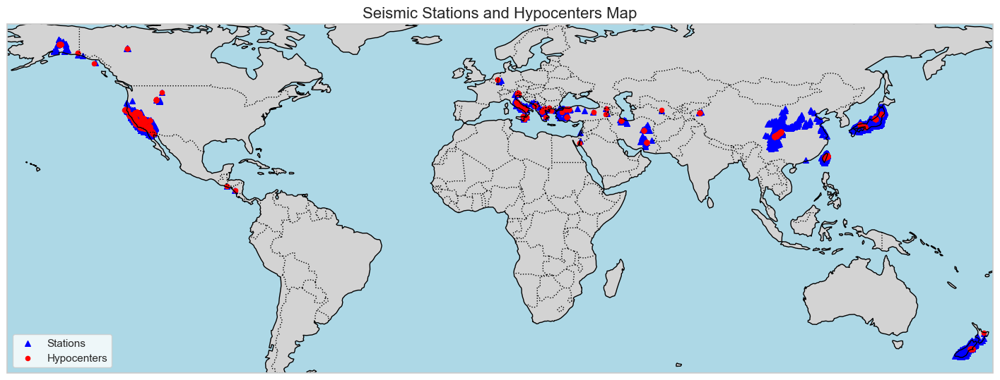

In [103]:
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cfeature

plt.figure(figsize=(18,12))
ax = plt.axes(projection=ccrs.PlateCarree())

# Límites opcionales: norte de Suramérica
# ax.set_extent([-85, -65, -5, 15])  

# Agregar elementos del mapa
ax.add_feature(cfeature.COASTLINE)
ax.add_feature(cfeature.BORDERS, linestyle=':')
ax.add_feature(cfeature.LAND, facecolor='lightgray')
ax.add_feature(cfeature.OCEAN, facecolor='lightblue')

# Estaciones (ej. en azul)
plt.scatter(df["Station Longitude"], df["Station Latitude"], 
            c="blue", s=30, marker="^", 
            label="Stations", transform=ccrs.PlateCarree())

# Hipocentros (ej. en rojo)
plt.scatter(df["Hypocenter Longitude (deg)"], df["Hypocenter Latitude (deg)"], 
            c="red", s=20, marker="o", 
            label="Hypocenters", transform=ccrs.PlateCarree())

# Título y leyenda
plt.title("Seismic Stations and Hypocenters Map", fontsize=16)
plt.legend(loc="lower left")

plt.show()


En este nuevo mapa ya se puede visualizar el contraste entre las estaciones que aparecen en los registros y los sismos registrados

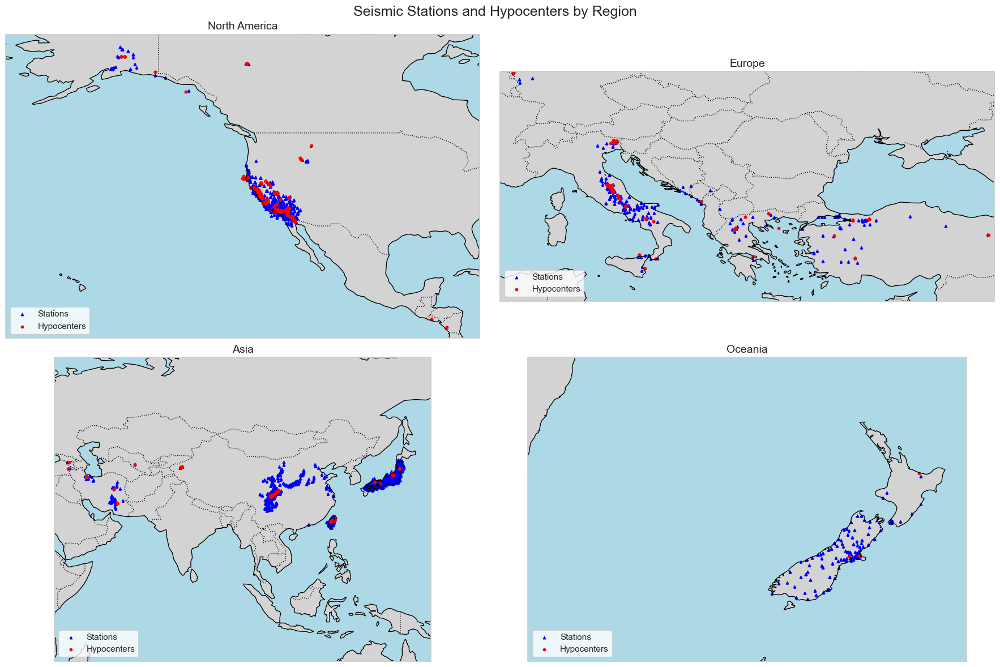

In [104]:
# Definir regiones (xmin, xmax, ymin, ymax)
regions = {
    "North America": [-170, -80, 10, 60],
    "Europe": [5, 40, 35, 50],
    "Asia": [40, 150, -10, 60],
    "Oceania": [150, 180, -50, -30]
}

fig, axes = plt.subplots(2, 2, figsize=(18, 12), subplot_kw={'projection': ccrs.PlateCarree()})
axes = axes.flatten()

for i, (region, extent) in enumerate(regions.items()):
    ax = axes[i]
    ax.set_extent(extent)

    # Agregar elementos del mapa
    ax.add_feature(cfeature.COASTLINE)
    ax.add_feature(cfeature.BORDERS, linestyle=":")
    ax.add_feature(cfeature.LAND, facecolor="lightgray")
    ax.add_feature(cfeature.OCEAN, facecolor="lightblue")

    # Estaciones
    ax.scatter(df["Station Longitude"], df["Station Latitude"], 
               c="blue", s=10, marker="^", 
               label="Stations", transform=ccrs.PlateCarree())

    # Hipocentros
    ax.scatter(df["Hypocenter Longitude (deg)"], df["Hypocenter Latitude (deg)"], 
               c="red", s=10, marker="o", 
               label="Hypocenters", transform=ccrs.PlateCarree())

    ax.set_title(region, fontsize=14)
    ax.legend(loc="lower left")

plt.suptitle("Seismic Stations and Hypocenters by Region", fontsize=18)
plt.tight_layout()
plt.show()


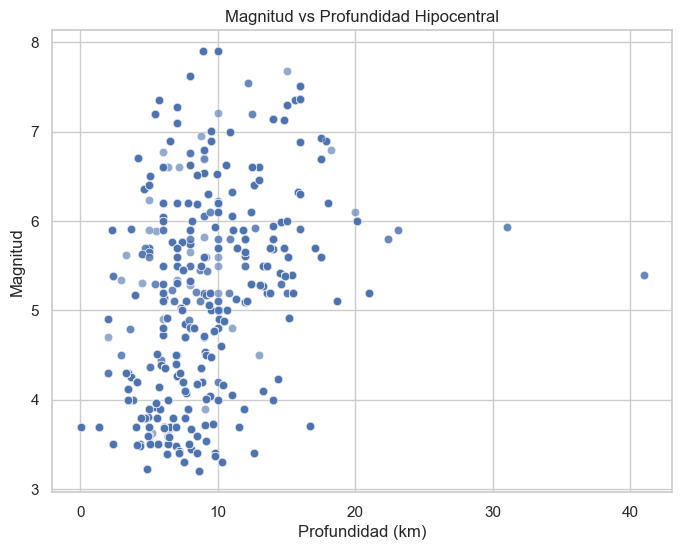

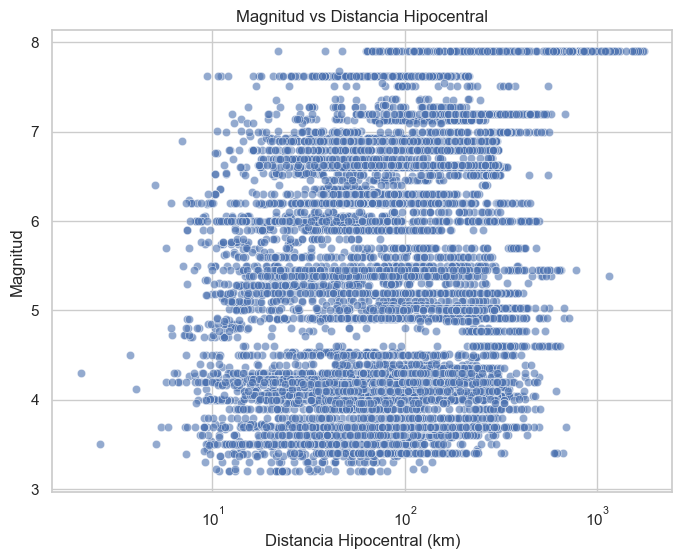

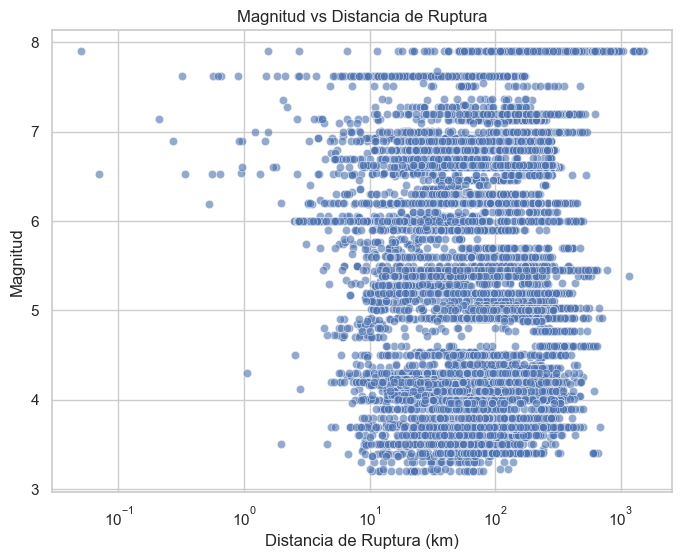

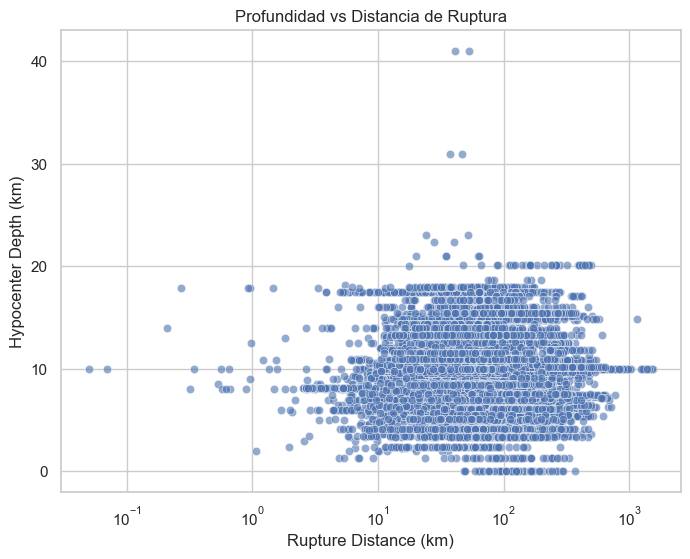

In [105]:
# 1. Magnitud vs Profundidad
plt.figure(figsize=(8,6))
sns.scatterplot(x="Hypocenter Depth (km)", y="Magnitude", data=df, alpha=0.6)
plt.title("Magnitud vs Profundidad Hipocentral")
plt.xlabel("Profundidad (km)")
plt.ylabel("Magnitud")
plt.show()

# 2. Magnitud vs Distancia hipocentral
plt.figure(figsize=(8,6))
sns.scatterplot(x="Rhypo_OpenQuake", y="Magnitude", data=df, alpha=0.6)
plt.title("Magnitud vs Distancia Hipocentral")
plt.xlabel("Distancia Hipocentral (km)")
plt.ylabel("Magnitud")
plt.xscale("log")
plt.show()

# 3. Magnitud vs Distancia de ruptura
plt.figure(figsize=(8,6))
sns.scatterplot(x="Rrup_OpenQuake", y="Magnitude", data=df, alpha=0.6)
plt.title("Magnitud vs Distancia de Ruptura")
plt.xlabel("Distancia de Ruptura (km)")
plt.ylabel("Magnitud")
plt.xscale("log")
plt.show()

# 4. Profundidad vs Distancia de ruptura
plt.figure(figsize=(8,6))
sns.scatterplot(x="Rrup_OpenQuake", y="Hypocenter Depth (km)", data=df, alpha=0.6)
plt.title("Profundidad vs Distancia de Ruptura")
plt.xscale("log")
plt.xlabel("Rupture Distance (km)")
plt.ylabel("Hypocenter Depth (km)")
plt.show()

De estas cuatro gráficas, principalmente se extrae que en términos de profundidad, los registros sismicos del NGA West 2 están entre los 0 y los 25km con cierto registro atípico acercándose a los 30 o 40km. <br>
Las variables de distancias (hipocentral y ruptura) se comportan de manera similar contra la magnitud como era de esperarse. Siendo que la distancia hipocentral está un poco mas dispersa


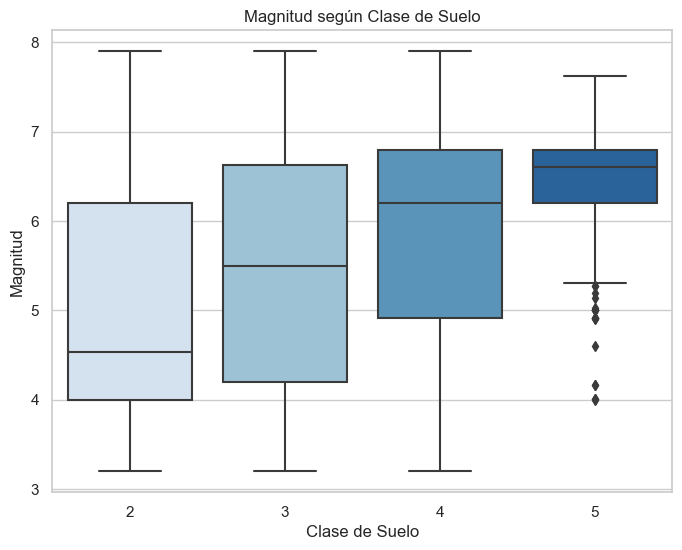

In [106]:
# 5. Magnitud vs Clase de suelo
plt.figure(figsize=(8,6))
sns.boxplot(x="Soil_Class", y="Magnitude", data=df, palette='Blues')
plt.title("Magnitud según Clase de Suelo")
plt.xlabel("Clase de Suelo")
plt.ylabel("Magnitud")
plt.show()

Se puede observar que a medida que la clase de suelo aumenta, la mediana se mueve junto con los rangos intercuartilicos para cubrir mayores valores de magnitud. <br>
Para la clase de suelo 2, la el 50% de los valores se encuentra entre valores de magnitudes de 4 a 6.3 aproximadamente, y el 25% está entre 6.3 y 7.9. <br>
Por otra parte, para la clase de suelo tipo 3, la diferencia que resalta con la clase de suelo tipo 2 es el valor de la mediana el cual se encuentra aproximadamente en 5.5, dando a entender que el 50% de los valores está entre 5.5 y 7.8.<br>
Para las clases de suelo de suelo tipo 4 y 5 comparten en particular el cuartil 3 equivalente al 75%, con lo que se concluye que el 25% de los valores para ambas clases está por encima de 6.7 aproximadamente.<br>
En particular la clase 5 posee una mediana muy cercana al cuartil 3 dando a entender que el 25% de los datos se encuentra acumulado en la pequeña franja aproximada de magnitudes 6.5 y 6.7. Asimismo es importante mencionar la presencia de datos atípicos para la clase de suelo 5. Muy pocos registros por debajo de magnitudes 5.3 aproximadamente

### Relaciones con la variable de respuesta

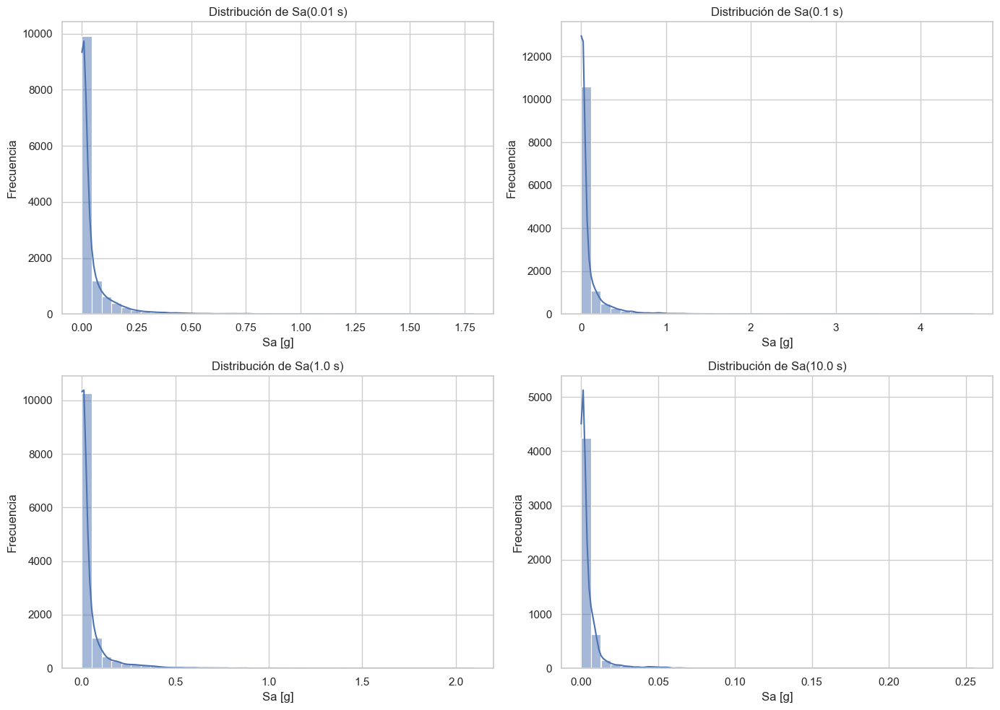

In [107]:
import matplotlib.pyplot as plt
import seaborn as sns

periodos_ref = ["T_0.01_RotD50", "T_0.1_RotD50", "T_1.0_RotD50", "T_10.0_RotD50"]

# --- 1. Distribución de Sa(T) ---
fig, axes = plt.subplots(2, 2, figsize=(14,10))
for ax, col in zip(axes.flatten(), periodos_ref):
    sns.histplot(df[col], bins=40, kde=True, ax=ax)
    ax.set_title(f"Distribución de Sa({col.split('_')[1]} s)")
    ax.set_xlabel("Sa [g]")
    ax.set_ylabel("Frecuencia")
plt.tight_layout()
plt.show()




Se escogen los periodos que puedan ser mas representativos del conjunto completo. En este caso de manera general se puede evidenciar una asimetría muy notoria hacia la derecha. Esto indica que antes de entrenar los modelos, así como hay que convertir las distancias de ruptura a logaritmo, la aceleración espectral también debe convertirse a logaritmo para suavizar su distribución

La variable de respuesta Sa es medida usando la dimensión g, que representa el porcentaje de aceleración de aceleración con respecto a la aceleración de la gravedad. Es por ello que un valor de 0.1g significa que es el 10% de la aceleración gravitacional, es decir 0.1 * 9.81 m/s^2 o 0.1 *981 cm/s^2

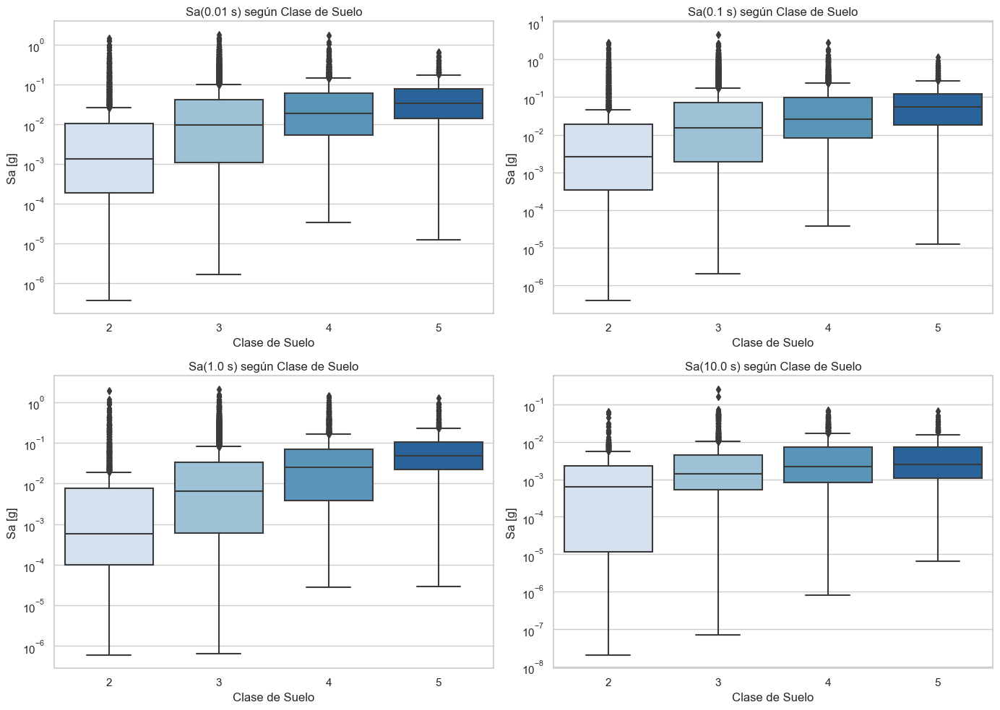

In [108]:
# --- 2. Boxplots por clase de suelo ---
fig, axes = plt.subplots(2, 2, figsize=(14,10))
for ax, col in zip(axes.flatten(), periodos_ref):
    sns.boxplot(x="Soil_Class", y=col, data=df, ax=ax , palette='Blues')
    ax.set_yscale("log")
    ax.set_title(f"Sa({col.split('_')[1]} s) según Clase de Suelo")
    ax.set_xlabel("Clase de Suelo")
    ax.set_ylabel("Sa [g]")
plt.tight_layout()
plt.show()

Las clases de suelo comparadas por valores de aceleración espectral nos confirma lo esperado inicialmente. En suelos menos densos el nivel de amenaza de un sismo con respecto a un sitio es mayor al resto. Una de las tantas conclusiones que se pueden sacar observando el comportamiento de los suelos 4 y 5 los cuales mantienen los rangos intercuartilicos y las medianas por encima de los otros dos tipos de suelo. <br>


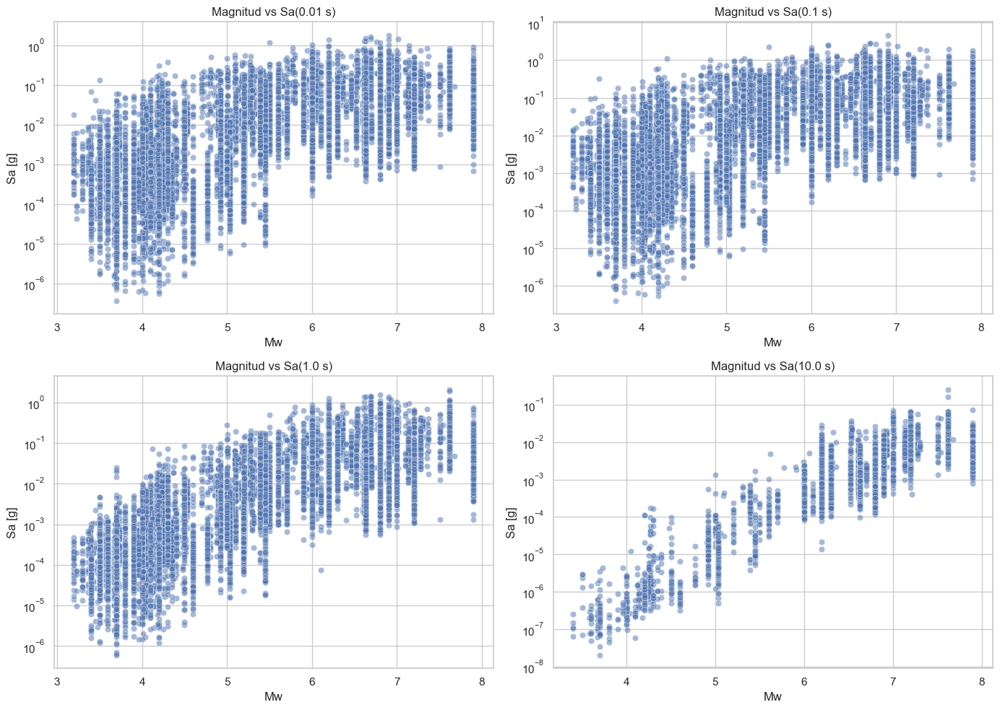

In [109]:
# --- 3. Sa(T) vs Magnitud ---
fig, axes = plt.subplots(2, 2, figsize=(14,10))
for ax, col in zip(axes.flatten(), periodos_ref):
    sns.scatterplot(x="Magnitude", y=col, data=df, alpha=0.5, ax=ax)
    ax.set_yscale("log")
    ax.set_title(f"Magnitud vs Sa({col.split('_')[1]} s)")
    ax.set_xlabel("Mw")
    ax.set_ylabel("Sa [g]")
plt.tight_layout()
plt.show()

Se puede observar gráficamente que si existe una corrrelación alta entre los valores de Magnitud y Aceleración espectral independientemente del periodo cuando se encuentra en escala logarítmica la aceleración. Se usan como referentes los periodos 0.01, 0.1, 1.0 y 10.0s para mostrar que el periodo no interfiere con la relación entre las variables Mw y Sa. <br>
También se puede evidenciar que a medida que aumenta el periodo, la cantidad de datos disminuye, esto gracias al periodo máximo confiable dado por la variable Tmax (el inverso de la frecuencia mas baja confiable)

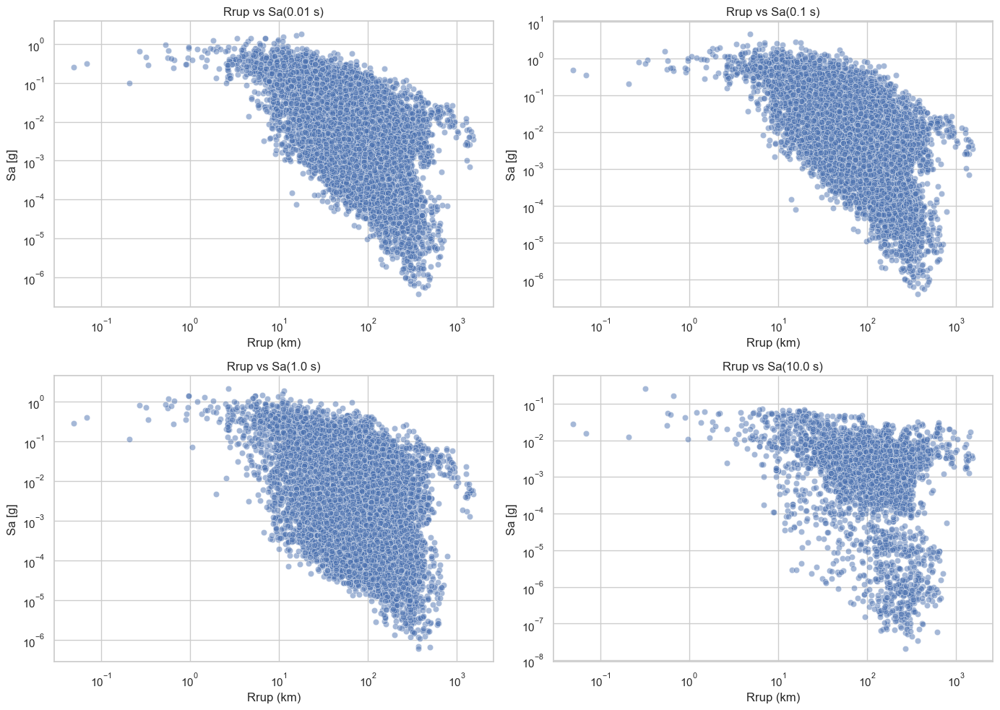

In [110]:
# --- 4. Sa(T) vs Distancia (Rrup) ---
fig, axes = plt.subplots(2, 2, figsize=(14,10))
for ax, col in zip(axes.flatten(), periodos_ref):
    sns.scatterplot(x="Rrup_OpenQuake", y=col, data=df, alpha=0.5, ax=ax)
    ax.set_xscale("log")
    ax.set_yscale("log")
    ax.set_title(f"Rrup vs Sa({col.split('_')[1]} s)")
    ax.set_xlabel("Rrup (km)")
    ax.set_ylabel("Sa [g]")
plt.tight_layout()
plt.show()


Se puede evidenciar la atenuación que existe de aceleración espectral a medida que incrementa la distancia de ruptura.<br>
Esta atenuación es una de las principales maneras que se tienen para identificar si un modelo se está comportando conforme a la Física. <br>
Si el modelo predice una curva Sa vs Rrup que decae cada vez más a medida que aumenta la distancia de ruptura en un eje logarítmico, se podría decir que al menos cumple con la atenuación.

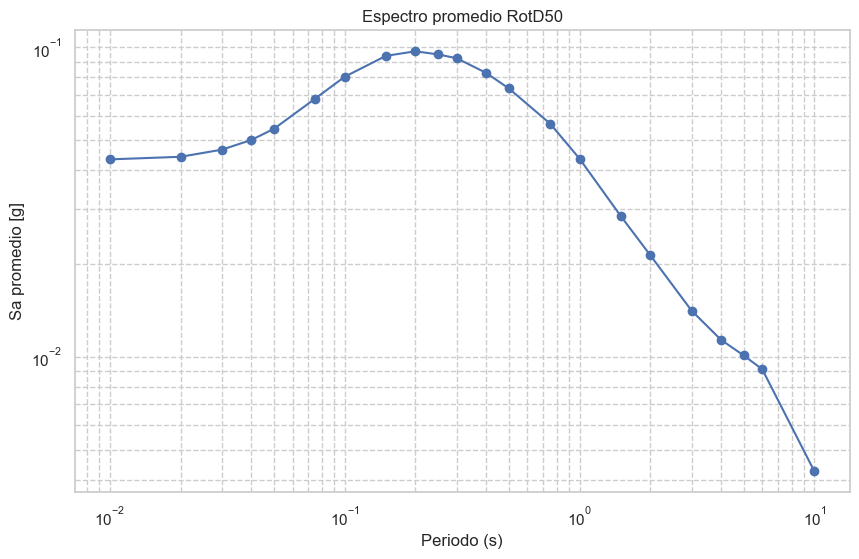

In [111]:

cols_spectra = df.filter(like="RotD50").columns
T = [float(c.split("_")[1]) for c in cols_spectra]
Sa_mean = df[cols_spectra].mean()

plt.figure(figsize=(10,6))
plt.plot(T, Sa_mean, marker="o")
plt.xscale("log")
plt.yscale("log")
plt.xlabel("Periodo (s)")
plt.ylabel("Sa promedio [g]")
plt.title("Espectro promedio RotD50")
plt.grid(True, which="both", ls="--")
plt.show()


En la presente gráfica se puede evidenciar lo que se espera como predicción de un algoritmo de ML aplicado a este problema. <br>
La figura Muestra la forma del espectro de respuesta con los periodos mas representativos. Se puede observar que luego de cierto periodo, las aceleraciones espectrales comienzan a caer incluso bajando a menos del mínimo impuesto por la primera aceleración espectral, la cual hace referencia a la aceleración máxima obtenida en un sitio a partir de un evento sísmico en particular, también conocido como PGA (Peak Ground Acceleration). 

## EDA Colombia

In [25]:
df_Col = pd.read_excel('C:/Users/elias/OneDrive/Desktop/MachineLearning/FinalProjectDL/Final_Project/CopiaDataBaseSGC.xlsx')
df_Col

,Record Sequence Number,EQID,Epicenter Latitude (deg; positive N),Epicenter Longitude (deg; positive E),Hypocenter Depth (km),Magnitude,Magnitude type,Tectonic environment (Crustal; Inslab; Interface; Stable; Deep; Volcanic; Oceanic_crust),Nodal Plane 1 Strike (deg),Nodal Plane 1 Dip (deg),...,T_2.5_RotD50,T_3.0_RotD50,T_4.0_RotD50,T_5.0_RotD50,T_6.0_RotD50,T_7.0_RotD50,T_7.5_RotD50,T_8.0_RotD50,T_9.0_RotD50,T_10.0_RotD50
0,76,CO_19940913100134,7.105,-76.665,14.0,6.0202,Mw,Crustal,4,64,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,79,CO_19961104172500,7.364,-77.380,14.0,6.2562,Mw,Crustal,188,43,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,89,CO_19961104172500,7.364,-77.380,14.0,6.2562,Mw,Crustal,188,43,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,93,CO_20070424085334,5.621,-75.895,50.6,5.1307,Mw,Crustal,154,23,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,95,CO_20080524192044,4.374,-73.708,14.7,5.8671,Mw,Crustal,196,82,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8806,6438,CO_20190616161836,6.820,-73.150,143.0,4.6000,Mw,Deep,313,76,...,0.006470,0.004137,0.001410,0.000652,0.000443,0.000404,0.000386,0.000362,0.000310,0.000262
8807,7490,CO_20180108125827,6.790,-72.980,153.4,4.9912,Mw,Deep,57,66,...,0.000897,0.000889,0.001219,0.000726,0.000456,0.000283,0.000231,0.000190,0.000151,0.000114
8808,8434,CO_20190616161836,6.820,-73.150,143.0,4.6000,Mw,Deep,313,76,...,0.004955,0.002588,0.001379,0.000911,0.000590,0.000530,0.000576,0.000566,0.000515,0.000518
8809,1340,CO_20150221222646,4.670,-76.180,95.0,5.1699,Mw,Inslab,93,51,...,0.000327,0.000221,0.000170,0.000152,0.000102,0.000080,0.000074,0.000072,0.000058,0.000059


In [26]:
df_Col[outputs]=df_Col[outputs]/980

In [27]:
columnas_a_eliminar = [
    "Record Sequence Number", "Station ID", "Station Code", "Magnitude type", "EQID", "Valor_T1.5",
    "Tmax", 
    #"Epicenter Latitude (deg; positive N)", "Epicenter Longitude (deg; positive E)",
    #"Station Latitude (deg positive N)", "Station Longitude (deg positive E)",
    "Topografía", "Geología",
    "Nodal Plane 1 Rake Angle (deg)", "Nodal Plane 2 Rake Angle (deg)",
    "Nodal Plane 2 Dip (deg)", "Nodal Plane 2 Strike (deg)",
    "Rx_OpenQuake", "Ry0_OpenQuake", "Rjb_OpenQuake",
    "Repi_OpenQuake",
    # "Rhypo_OpenQuake",
    "Station Elevation (m)",
    #"Soil_Class",
    "Nodal Plane 1 Strike (deg)", "Nodal Plane 1 Dip (deg)",
    "Fault Plane (1; 2; X)", "Style-of-Faulting (S; R; N; U)",
    "Tn",
    'Record Sequence Number','EQID','Magnitude type',
    'Tectonic environment (Crustal; Inslab; Interface; Stable; Deep; Volcanic; Oceanic_crust)'
]


In [28]:
df_Col = df_Col[df_Col['Tectonic environment (Crustal; Inslab; Interface; Stable; Deep; Volcanic; Oceanic_crust)']=='Crustal']

In [29]:
df_Col.drop(columns=columnas_a_eliminar, inplace=True)

In [30]:
df_Col

,Epicenter Latitude (deg; positive N),Epicenter Longitude (deg; positive E),Hypocenter Depth (km),Magnitude,Station Latitude (deg positive N),Station Longitude (deg positive E),Soil_Class,Rrup_OpenQuake,Rhypo_OpenQuake,T_0.01_RotD50,...,T_2.5_RotD50,T_3.0_RotD50,T_4.0_RotD50,T_5.0_RotD50,T_6.0_RotD50,T_7.0_RotD50,T_7.5_RotD50,T_8.0_RotD50,T_9.0_RotD50,T_10.0_RotD50
0,7.105,-76.665,14.0,6.0202,5.6630,-75.8970,1,174.684394,181.353681,0.004946,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,7.364,-77.380,14.0,6.2562,5.6630,-75.8970,1,244.405678,254.752031,0.001851,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,7.364,-77.380,14.0,6.2562,5.2614,-75.8125,2,284.525886,295.168858,0.001642,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,5.621,-75.895,50.6,5.1307,5.2614,-75.8125,2,65.201764,67.842661,0.113558,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,4.374,-73.708,14.7,5.8671,5.2614,-75.8125,2,247.402211,254.069428,0.000849,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8798,3.440,-74.190,10.0,4.1000,1.1890,-77.3220,5,428.091130,428.905798,0.000004,...,0.001570,1.087456e-06,6.427327e-07,3.359714e-07,2.371388e-07,0.000164,0.000139,0.000118,0.000086,6.632653e-08
8799,3.430,-74.200,18.0,4.0000,1.1890,-77.3220,5,426.956629,427.631871,0.000005,...,0.001319,9.019724e-07,4.762469e-07,2.486122e-07,1.713980e-07,0.000120,0.000102,0.000088,0.000069,6.234694e-08
8800,3.410,-74.170,15.0,4.3000,1.2097,-77.2563,5,420.098899,421.640421,0.000009,...,0.003315,2.928746e-06,2.381339e-06,2.458191e-06,1.652310e-06,0.000914,0.000798,0.000681,0.000466,3.452092e-07
8801,7.270,-78.640,4.0,5.1000,1.2097,-77.2563,5,689.662530,691.759807,0.000015,...,0.001481,8.369194e-07,4.056827e-07,2.166969e-07,1.402816e-07,0.000092,0.000081,0.000075,0.000060,4.969388e-08


         Magnitude  Hypocenter Depth (km)  Rhypo_OpenQuake  Rrup_OpenQuake
count  4625.000000            4625.000000      4625.000000     4625.000000
mean      4.888967              14.855676       603.941994      600.933626
std       0.538996              11.010251       391.493761      390.569914
min       3.800000               1.000000        15.963300       12.535892
25%       4.410000              10.000000       272.109203      269.646771
50%       4.861200              10.000000       521.087881      519.074539
75%       5.106300              17.000000       858.798572      856.204208
max       6.994800              58.700000      1729.619610     1719.484836


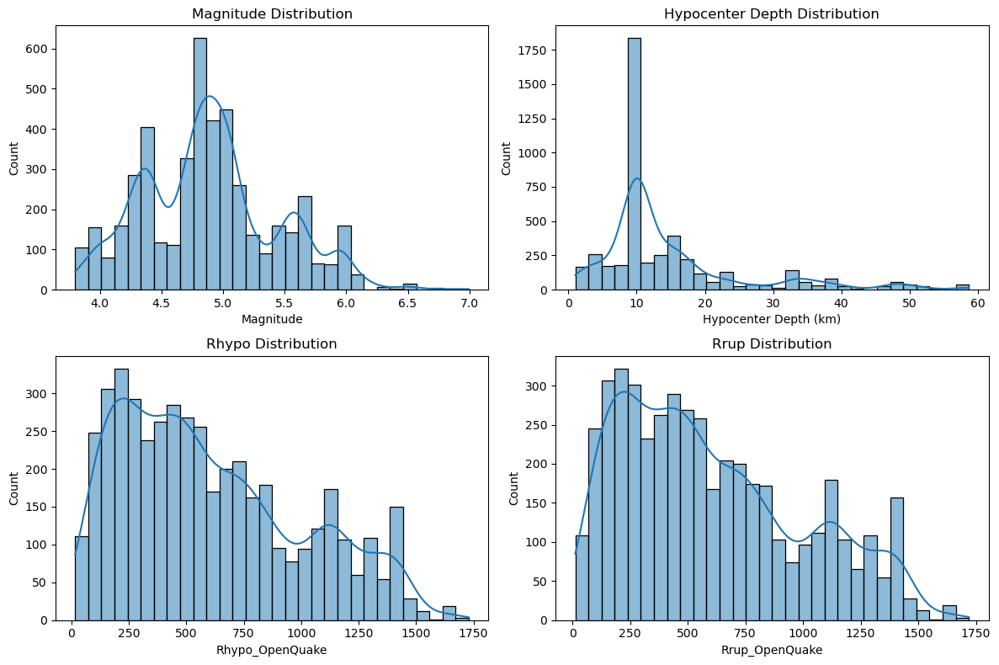

In [31]:
# 1. Descriptivos
print(df_Col[['Magnitude', 'Hypocenter Depth (km)', 'Rhypo_OpenQuake', 'Rrup_OpenQuake']].describe())

# 2. Histogramas
fig, axes = plt.subplots(2, 2, figsize=(12, 8))
sns.histplot(df_Col['Magnitude'], bins=30, kde=True, ax=axes[0,0])
axes[0,0].set_title("Magnitude Distribution")

sns.histplot(df_Col['Hypocenter Depth (km)'], bins=30, kde=True, ax=axes[0,1])
axes[0,1].set_title("Hypocenter Depth Distribution")

sns.histplot(df_Col['Rhypo_OpenQuake'], bins=30, kde=True, ax=axes[1,0])
axes[1,0].set_title("Rhypo Distribution")

sns.histplot(df_Col['Rrup_OpenQuake'], bins=30, kde=True, ax=axes[1,1])
axes[1,1].set_title("Rrup Distribution")


plt.tight_layout()
plt.show()



Por parte del dataset colombiano, se puede ver un poco mas dispersa la distribución, sin embargo, aún se puede identificar la asimetría hacia la derecha, por lo tanto aún es necesario hacer la transformación logarítmica a las distancias.

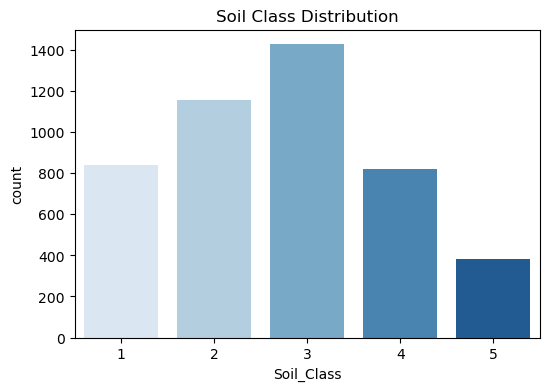

In [32]:
# 3. Soil_Class
plt.figure(figsize=(6,4))
sns.countplot(x="Soil_Class", data=df_Col, palette='Blues')
plt.title("Soil Class Distribution")
plt.show()

En este caso, para la distribución de sismos registrados por estaciones colombianas, ha sido posible clasificar los suelos tipo 1, lo que ayudará a darle mayor variabilidad al grupo de datos completo juntando el NGA West 2 y el Colombiano. <br>
La clase predominante sigue siendo el tipo de suelo 3 que corresponde a la clasificación "Hard soil". Le siguen de cerca la clasificación 2 (Rock or stiff soil) y la clasificación 4 (Medium soil).para dejar en el último lugar, el suelo tipo 5 (Soft Soil) siendo este el menos frecuente.

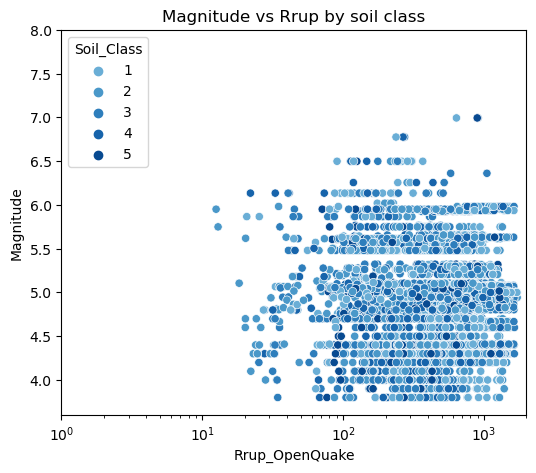

In [33]:
# 4. Relaciones bivariadas
palette_dark_blues = sns.color_palette("Blues", n_colors=9)[4:]
plt.figure(figsize=(6,5))
sns.scatterplot(x="Rrup_OpenQuake", y="Magnitude", hue="Soil_Class", data=df_Col,
                palette=palette_dark_blues)
plt.ylim(3.6, 8)
plt.xlim(1, 2000)
plt.xscale("log")
plt.title("Magnitude vs Rrup by soil class")
plt.show()

Una de las mas grandes desventajas que tenemos en el dataset colombiano es el hecho de que no contamos con suficientes registros de sismos corticales de gran magnitud (Mw > 6.0) y tampoco se cuenta con registros a distancias de ruptura cortos. Es por ello que una de las opciones tomadas fue de tratar de rellenar o darle mas variabilidad al dataset juntándolo con otro dataset, para que luego un modelo construido pueda ver más allá de lo que los registros colombianos podrían otorgar.


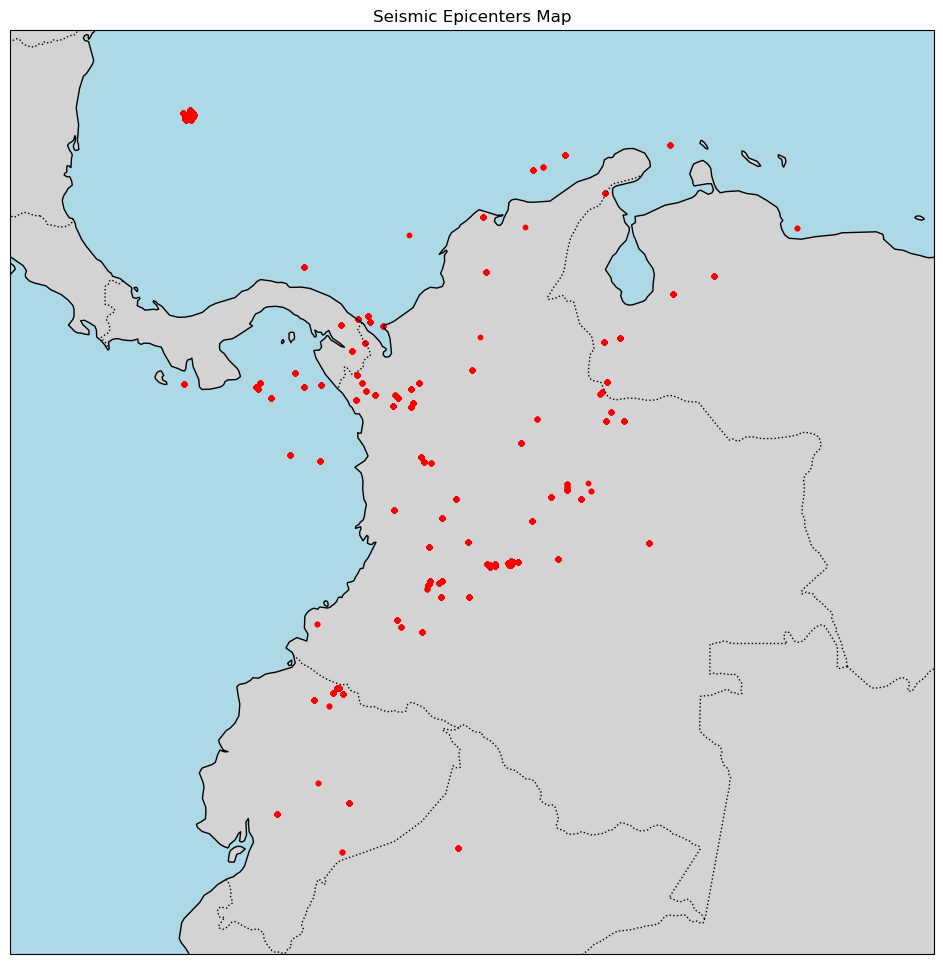

In [34]:
plt.figure(figsize=(20,12))
ax = plt.axes(projection=ccrs.PlateCarree())
ax.set_extent([-85, -65, -5, 15])  # límites en grados (ej: norte de Suramérica)

ax.add_feature(cfeature.COASTLINE)
ax.add_feature(cfeature.BORDERS, linestyle=':')
ax.add_feature(cfeature.LAND, facecolor='lightgray')
ax.add_feature(cfeature.OCEAN, facecolor='lightblue')

plt.scatter(df_Col["Epicenter Longitude (deg; positive E)"], df_Col["Epicenter Latitude (deg; positive N)"], 
            c="red", s=10, transform=ccrs.PlateCarree())

plt.title("Seismic Epicenters Map")
plt.show()

Observando el mapa y como se distribuyen geograficamente los eventos corticales registrados, se puede concluir que en las regiones amazonas y orinoquia no se presentan comúnmente este tipo de sismos, sin embargo, eso no excluye la posibilidad de que sean afectadas.<br>
Se cuentan con registros corticales en paises vecinos como Ecuador, Venezuela y Panamá.

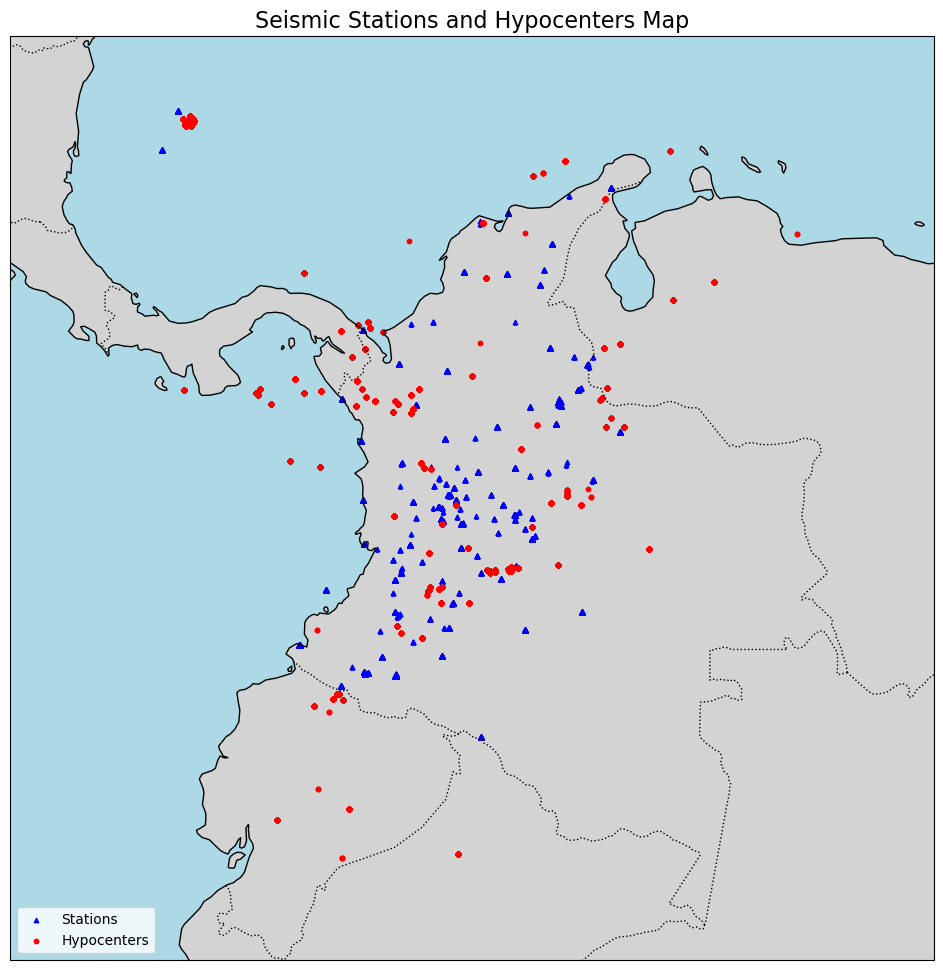

In [35]:
plt.figure(figsize=(18,12))
ax = plt.axes(projection=ccrs.PlateCarree())

# Límites opcionales: norte de Suramérica
ax.set_extent([-85, -65, -5, 15])  

# Agregar elementos del mapa
ax.add_feature(cfeature.COASTLINE)
ax.add_feature(cfeature.BORDERS, linestyle=':')
ax.add_feature(cfeature.LAND, facecolor='lightgray')
ax.add_feature(cfeature.OCEAN, facecolor='lightblue')

# Estaciones (ej. en azul)
plt.scatter(df_Col["Station Longitude (deg positive E)"], df_Col["Station Latitude (deg positive N)"], 
            c="blue", s=10, marker="^", 
            label="Stations", transform=ccrs.PlateCarree())

# Hipocentros (ej. en rojo)
plt.scatter(df_Col["Epicenter Longitude (deg; positive E)"], df_Col["Epicenter Latitude (deg; positive N)"], 
            c="red", s=10, marker="o", 
            label="Hypocenters", transform=ccrs.PlateCarree())

# Título y leyenda
plt.title("Seismic Stations and Hypocenters Map", fontsize=16)
plt.legend(loc="lower left")

plt.show()


Se puede observar también el contraste entre las ubicaciones de las estaciones y las ubicaciones de los registros sismicos. Nótese que hay ausencia de estaciones sísmicas en las regiones de amazonas y orinoquia que hayan registrado los eventos sismicos

In [36]:
df_Col = df_Col[df_Col['T_0.01_RotD50']>=1e-7]

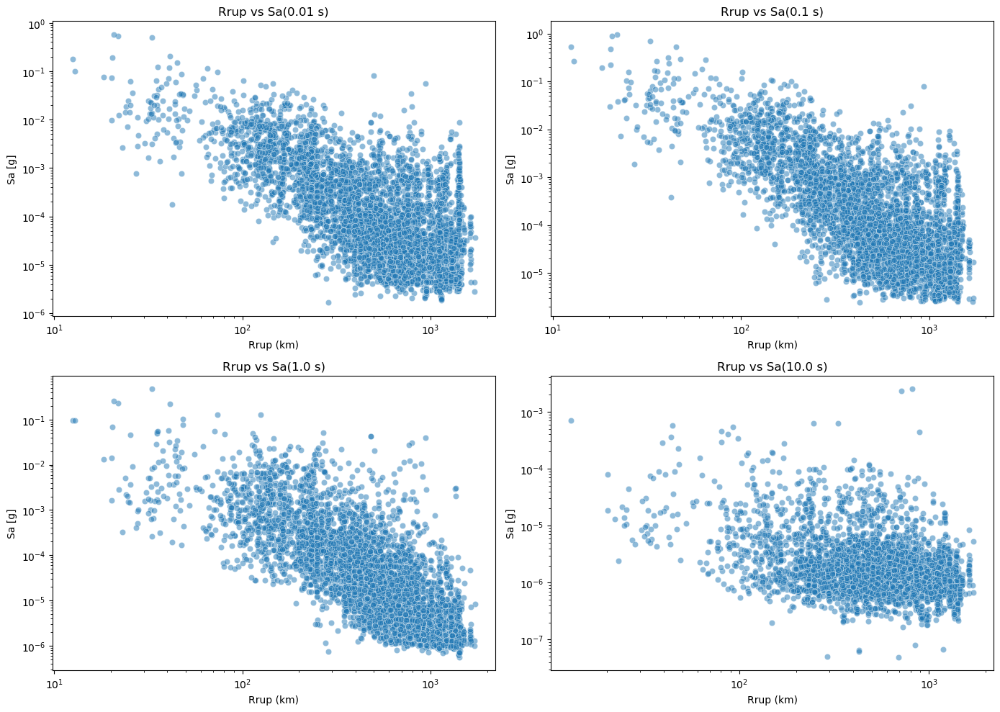

In [37]:
# --- 4. Sa(T) vs Distancia (Rrup) ---
fig, axes = plt.subplots(2, 2, figsize=(14,10))
for ax, col in zip(axes.flatten(), periodos_ref):
    sns.scatterplot(x="Rrup_OpenQuake", y=col, data=df_Col, alpha=0.5, ax=ax)
    ax.set_xscale("log")
    ax.set_yscale("log")
    ax.set_title(f"Rrup vs Sa({col.split('_')[1]} s)")
    ax.set_xlabel("Rrup (km)")
    ax.set_ylabel("Sa [g]")
plt.tight_layout()
plt.show()

Se puede evidenciar una atenuación menos marcada que la propuesta por la base de datos de NGA West 2, sin embargo, la hipótesis de que a medida que la distancia de ruptura aumenta la aceleración disminuye sigue cobrando sentido.

## ETL Full database

### Extracción

Ambos datasets cargados en excel, representan las mediciones de numerosas estaciones sísmicas en algunas partes del mundo, son concatenados para darle mayor variabilidad al proyecto.

In [38]:
df

,Hypocenter Latitude (deg),Hypocenter Longitude (deg),Station Latitude,Station Longitude,Hypocenter Depth (km),Magnitude,Rhypo_OpenQuake,Rrup_OpenQuake,Soil_Class,T_0.01_RotD50,...,T_0.5_RotD50,T_0.75_RotD50,T_1.0_RotD50,T_1.5_RotD50,T_2.0_RotD50,T_3.0_RotD50,T_4.0_RotD50,T_5.0_RotD50,T_6.0_RotD50,T_10.0_RotD50
0,46.61000,-111.96000,46.58000,-112.0300,6.000,6.00,8.71000,2.86,3,0.161934,...,0.143020,0.092829,0.101136,0.059109,0.035895,0.015257,0.007987,0.004644,0.003037,NaN
2,40.40000,-125.10000,40.57600,-124.2630,10.000,5.80,74.17000,71.57,4,0.040997,...,0.082295,0.056946,0.035785,0.016157,0.009347,0.002960,NaN,NaN,NaN,NaN
4,40.30000,-124.80000,40.57600,-124.2630,10.000,5.50,55.78000,53.58,4,0.122486,...,0.223093,0.091499,0.093659,0.026785,0.013654,NaN,NaN,NaN,NaN,NaN
5,32.76010,-115.41620,32.79400,-115.5490,8.800,6.95,15.69000,6.09,4,0.234619,...,0.629952,0.435350,0.351286,0.197357,0.215745,0.106360,0.046965,NaN,NaN,NaN
10,40.28300,-124.80000,40.57600,-124.2630,10.000,5.80,56.85000,53.77,4,0.107289,...,0.172930,0.124190,0.085661,0.040947,0.019499,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
21293,37.86037,-122.23589,37.58230,-122.4201,8.465,3.60,35.89050,35.63,2,0.005176,...,0.001476,0.000493,0.000260,0.000114,NaN,NaN,NaN,NaN,NaN,NaN
21294,37.86037,-122.23589,37.40370,-122.1760,8.465,3.60,51.66153,51.36,3,0.000505,...,0.000350,0.000166,0.000093,0.000043,0.000016,NaN,NaN,NaN,NaN,NaN
21295,37.86037,-122.23589,37.58640,-122.5022,8.465,3.60,39.34073,39.13,3,0.003058,...,0.000883,0.000366,0.000123,0.000052,0.000032,NaN,NaN,NaN,NaN,NaN
21296,37.86037,-122.23589,37.94910,-122.4085,8.465,3.60,19.97517,19.44,2,0.001620,...,0.000810,0.000282,0.000159,0.000067,0.000032,NaN,NaN,NaN,NaN,NaN


In [39]:
df = df.rename(columns={"Hypocenter Latitude (deg)": "Seismic Latitude"})
df = df.rename(columns={"Hypocenter Longitude (deg)": "Seismic Longitude"})
df_Col = df_Col.rename(columns={"Epicenter Latitude (deg; positive N)": "Seismic Latitude"})
df_Col = df_Col.rename(columns={"Epicenter Longitude (deg; positive E)": "Seismic Longitude"})
df_Col = df_Col.rename(columns={"Station Latitude (deg positive N)": "Station Latitude"})
df_Col = df_Col.rename(columns={"Station Longitude (deg positive E)": "Station Longitude"})

In [40]:
inputs = df.columns[0:9]
inputs

Index(['Seismic Latitude', 'Seismic Longitude', 'Station Latitude',
       'Station Longitude', 'Hypocenter Depth (km)', 'Magnitude',
       'Rhypo_OpenQuake', 'Rrup_OpenQuake', 'Soil_Class'],
      dtype='object')

In [41]:
var = inputs.tolist() + outputs.tolist()
df_Col=df_Col[var]

In [42]:
df_Col['origen'] = 'Colombia'
df['origen'] = 'NGAW2'

In [43]:
df_Col

,Seismic Latitude,Seismic Longitude,Station Latitude,Station Longitude,Hypocenter Depth (km),Magnitude,Rhypo_OpenQuake,Rrup_OpenQuake,Soil_Class,T_0.01_RotD50,...,T_0.75_RotD50,T_1.0_RotD50,T_1.5_RotD50,T_2.0_RotD50,T_3.0_RotD50,T_4.0_RotD50,T_5.0_RotD50,T_6.0_RotD50,T_10.0_RotD50,origen
0,7.105,-76.665,5.6630,-75.8970,14.0,6.0202,181.353681,174.684394,1,0.004946,...,0.008565,0.011731,0.008412,0.003945,NaN,NaN,NaN,NaN,NaN,Colombia
1,7.364,-77.380,5.6630,-75.8970,14.0,6.2562,254.752031,244.405678,1,0.001851,...,0.002285,0.001380,0.000781,0.000327,NaN,NaN,NaN,NaN,NaN,Colombia
2,7.364,-77.380,5.2614,-75.8125,14.0,6.2562,295.168858,284.525886,2,0.001642,...,0.002577,0.001191,0.000454,0.000275,NaN,NaN,NaN,NaN,NaN,Colombia
3,5.621,-75.895,5.2614,-75.8125,50.6,5.1307,67.842661,65.201764,2,0.113558,...,0.009564,0.005405,0.001989,0.001150,NaN,NaN,NaN,NaN,NaN,Colombia
4,4.374,-73.708,5.2614,-75.8125,14.7,5.8671,254.069428,247.402211,2,0.000849,...,0.002152,0.002154,0.001308,0.000420,NaN,NaN,NaN,NaN,NaN,Colombia
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8798,3.440,-74.190,1.1890,-77.3220,10.0,4.1000,428.905798,428.091130,5,0.000004,...,0.000002,0.000001,0.000001,0.000001,1.087456e-06,6.427327e-07,3.359714e-07,2.371388e-07,6.632653e-08,Colombia
8799,3.430,-74.200,1.1890,-77.3220,18.0,4.0000,427.631871,426.956629,5,0.000005,...,0.000002,0.000001,0.000001,0.000001,9.019724e-07,4.762469e-07,2.486122e-07,1.713980e-07,6.234694e-08,Colombia
8800,3.410,-74.170,1.2097,-77.2563,15.0,4.3000,421.640421,420.098899,5,0.000009,...,0.000013,0.000008,0.000003,0.000004,2.928746e-06,2.381339e-06,2.458191e-06,1.652310e-06,3.452092e-07,Colombia
8801,7.270,-78.640,1.2097,-77.2563,4.0,5.1000,691.759807,689.662530,5,0.000015,...,0.000003,0.000002,0.000002,0.000002,8.369194e-07,4.056827e-07,2.166969e-07,1.402816e-07,4.969388e-08,Colombia


In [44]:
df_total = pd.concat([df, df_Col], ignore_index=True)

In [45]:
df_total

,Seismic Latitude,Seismic Longitude,Station Latitude,Station Longitude,Hypocenter Depth (km),Magnitude,Rhypo_OpenQuake,Rrup_OpenQuake,Soil_Class,T_0.01_RotD50,...,T_0.75_RotD50,T_1.0_RotD50,T_1.5_RotD50,T_2.0_RotD50,T_3.0_RotD50,T_4.0_RotD50,T_5.0_RotD50,T_6.0_RotD50,T_10.0_RotD50,origen
0,46.6100,-111.9600,46.5800,-112.0300,6.0,6.0000,8.710000,2.860000,3,0.161934,...,0.092829,0.101136,0.059109,0.035895,1.525704e-02,7.987177e-03,4.643577e-03,3.036607e-03,NaN,NGAW2
1,40.4000,-125.1000,40.5760,-124.2630,10.0,5.8000,74.170000,71.570000,4,0.040997,...,0.056946,0.035785,0.016157,0.009347,2.959554e-03,NaN,NaN,NaN,NaN,NGAW2
2,40.3000,-124.8000,40.5760,-124.2630,10.0,5.5000,55.780000,53.580000,4,0.122486,...,0.091499,0.093659,0.026785,0.013654,NaN,NaN,NaN,NaN,NaN,NGAW2
3,32.7601,-115.4162,32.7940,-115.5490,8.8,6.9500,15.690000,6.090000,4,0.234619,...,0.435350,0.351286,0.197357,0.215745,1.063604e-01,4.696507e-02,NaN,NaN,NaN,NGAW2
4,40.2830,-124.8000,40.5760,-124.2630,10.0,5.8000,56.850000,53.770000,4,0.107289,...,0.124190,0.085661,0.040947,0.019499,NaN,NaN,NaN,NaN,NaN,NGAW2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
17507,3.4400,-74.1900,1.1890,-77.3220,10.0,4.1000,428.905798,428.091130,5,0.000004,...,0.000002,0.000001,0.000001,0.000001,1.087456e-06,6.427327e-07,3.359714e-07,2.371388e-07,6.632653e-08,Colombia
17508,3.4300,-74.2000,1.1890,-77.3220,18.0,4.0000,427.631871,426.956629,5,0.000005,...,0.000002,0.000001,0.000001,0.000001,9.019724e-07,4.762469e-07,2.486122e-07,1.713980e-07,6.234694e-08,Colombia
17509,3.4100,-74.1700,1.2097,-77.2563,15.0,4.3000,421.640421,420.098899,5,0.000009,...,0.000013,0.000008,0.000003,0.000004,2.928746e-06,2.381339e-06,2.458191e-06,1.652310e-06,3.452092e-07,Colombia
17510,7.2700,-78.6400,1.2097,-77.2563,4.0,5.1000,691.759807,689.662530,5,0.000015,...,0.000003,0.000002,0.000002,0.000002,8.369194e-07,4.056827e-07,2.166969e-07,1.402816e-07,4.969388e-08,Colombia


### Transformación

Inicialmente para entender el conjunto de datos fue necesario filtrar por magnitud por las razones mencionadas anteriormente. Asimismo por parte del dataset colombiano fue filtrado para solamente incluir los registros corticales ya que son el objetivo de esta investigación.

El dataset de NGA-West2 no incluía directamente la clasificación de los suelos. Sin embargo, a partir de los valores aproximados de Vs30 reportados en la base, fue posible realizar una clasificación interna de los registros antes de su incorporación a este proyecto, siguiendo los criterios propuestos por Arteta et al. (2023) quienes usaron el método HVSR (Horizontal-to-Vertical Spectral Ratio) como criterio de referencia para la caracterización de suelos.

![TablaClasificacionSuelos](images/TablaClasificacionSuelos.png)


Como se pudo evidenciar con los EDA individuales (cada dataset separado) habrán variables que requerirán una transformación logarítmica para que al ingresar al modelado sean mas tratables. Entre estas se incluyen las variables de respuesta

Para preparar el dataset como último filtro estadístico se usará la regresión lineal para marcar la tendencia de los datos usando la primera variable de respuesta que corresponde a la aceleración a los 0.01s de periodo (PGA), y las distancias hipocentrales. Una vez obtenida la regresión lineal, para filtrar de manera inteligente y permanecer con información de calidad, se creará una segunda línea de tendencia calculada usando dos veces la desviación estándar por debajo. <br>
Al crear la línea de tendencia usando dos veces la desviación estándar, para filtrar es necesario un umbral o una intersección que permita clasificar las zonas. Se usará como referente el valor de 1e-4 para la variable de respuesta PGA. La razón detrás de esto es asegurar una adecuada relación señal/ruido. En 2021 Arteta. et al. evaluaron el impacto de el PGA minimo sobre la varianza de los datos, finalmente se escogió un valor de 1e-4 g. Este criterio coincide con el adoptado por Kwak y Seyhan (2020) en sus estudios sobre amplificación de sitio en Japón, con el fin de evitar registros dominados por ruido. <br>

Este filtro se hará cada 1 bin de magnitud para dar variabilidad por zonas y no estar totalmente sesgado hacia los sismos de menor impacto, los cuales son los que predominan en el dataset en conjunto

### Filtrado

In [46]:
df_total = df_total[df_total['T_0.01_RotD50'] > 10e-6]

In [47]:
df_34= df_total.copy()
df_45= df_total.copy()
df_56= df_total.copy()
df_67= df_total.copy()
df_78= df_total.copy()

In [48]:
df34= df_total [(df_total['Magnitude'] < 4)]
df34= df34 [(df34['Magnitude'] >= 3)]

df45= df_total [(df_total['Magnitude'] < 5)]
df45= df45 [(df45['Magnitude'] >= 4)]

df56= df_total [(df_total['Magnitude'] < 6)]
df56= df56 [(df56['Magnitude'] >= 5)]

df67= df_total [(df_total['Magnitude'] < 7)]
df67= df67 [(df67['Magnitude'] >= 6)]

df78= df_total [(df_total['Magnitude'] <= 8)]
df78= df78 [(df78['Magnitude'] >= 7)]

In [49]:
df_30_35 = df_total[(df_total["Magnitude"] >= 3.0) & (df_total["Magnitude"] < 3.5)]
df_35_40 = df_total[(df_total["Magnitude"] >= 3.5) & (df_total["Magnitude"] < 4.0)]
df_40_45 = df_total[(df_total["Magnitude"] >= 4.0) & (df_total["Magnitude"] < 4.5)]
df_45_50 = df_total[(df_total["Magnitude"] >= 4.5) & (df_total["Magnitude"] < 5.0)]
df_50_55 = df_total[(df_total["Magnitude"] >= 5.0) & (df_total["Magnitude"] < 5.5)]
df_55_60 = df_total[(df_total["Magnitude"] >= 5.5) & (df_total["Magnitude"] < 6.0)]
df_60_65 = df_total[(df_total["Magnitude"] >= 6.0) & (df_total["Magnitude"] < 6.5)]
df_65_70 = df_total[(df_total["Magnitude"] >= 6.5) & (df_total["Magnitude"] < 7.0)]
df_70_75 = df_total[(df_total["Magnitude"] >= 7.0) & (df_total["Magnitude"] < 7.5)]
df_75_80 = df_total[(df_total["Magnitude"] >= 7.5) & (df_total["Magnitude"] <= 8.0)]


In [50]:
dfprueba = pd.concat([df34, df45, df56, df67,df78], ignore_index=True)

In [51]:
from sklearn.linear_model import LinearRegression

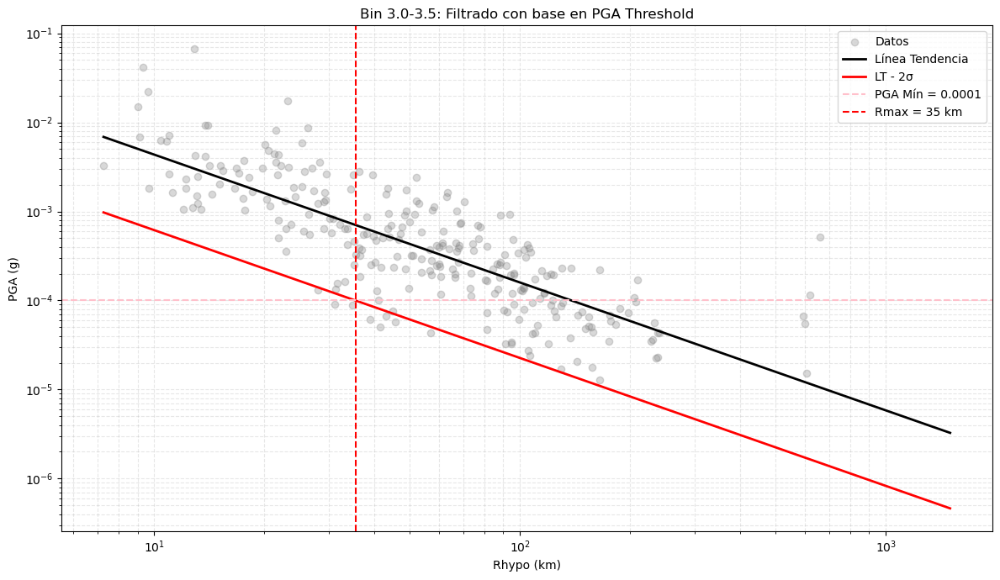

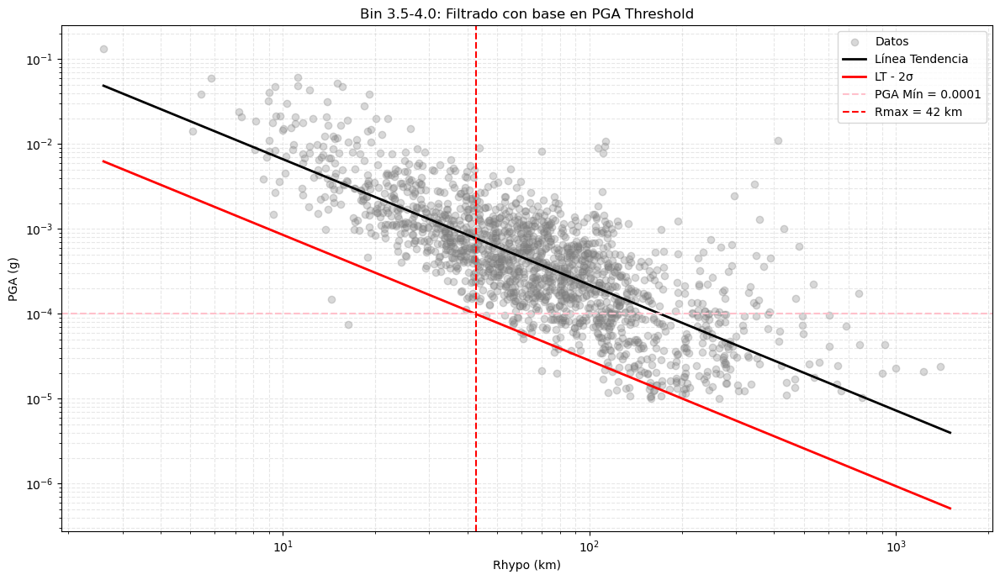

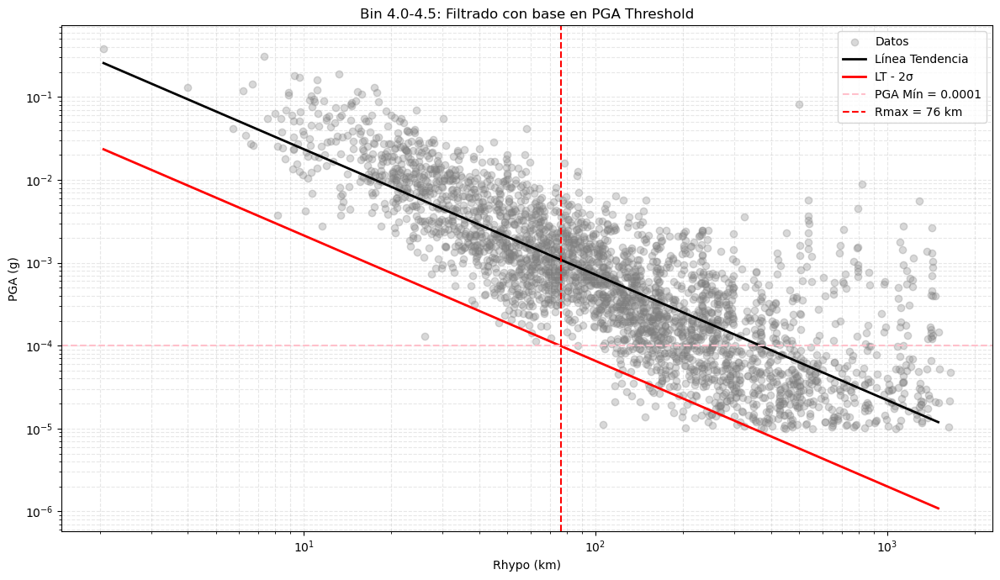

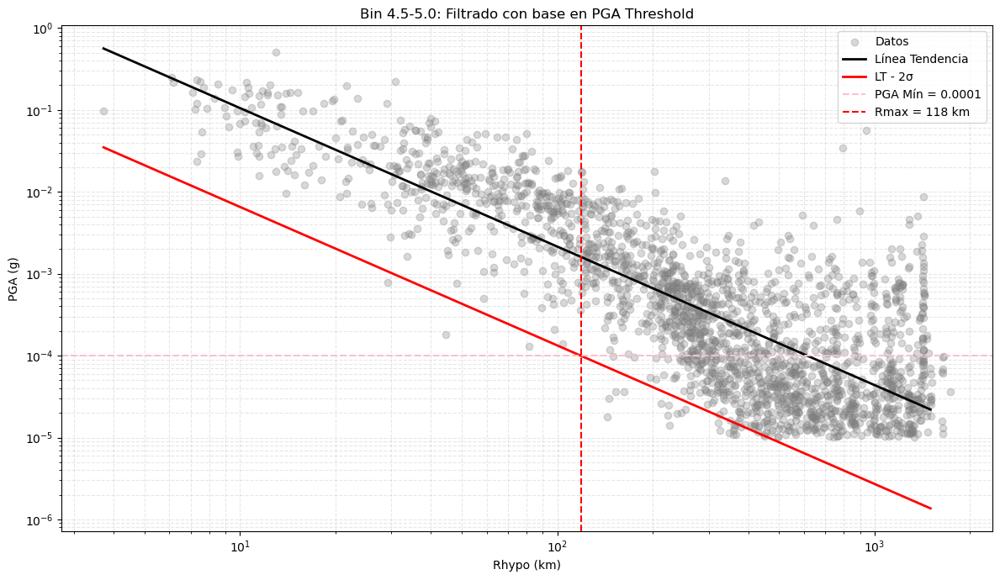

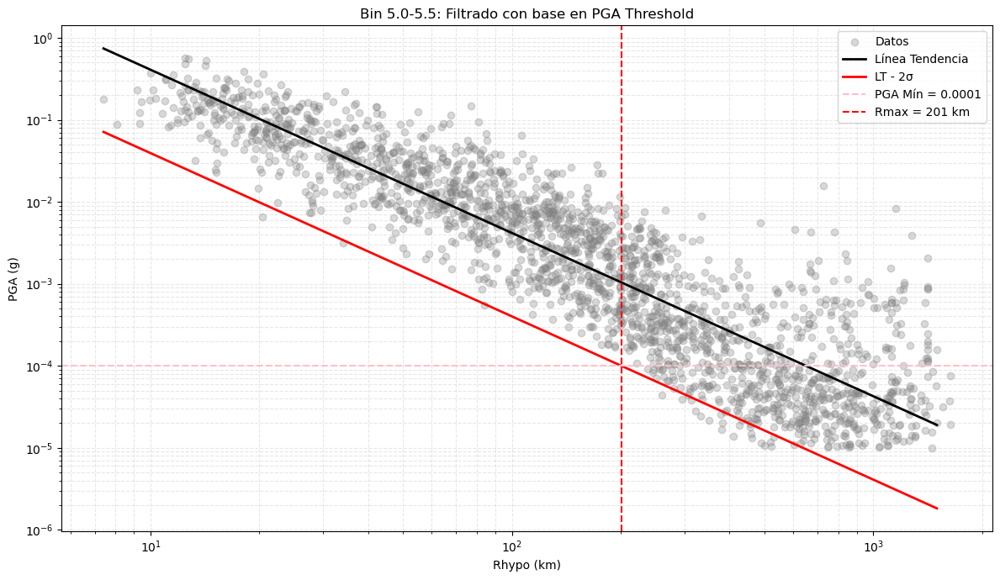

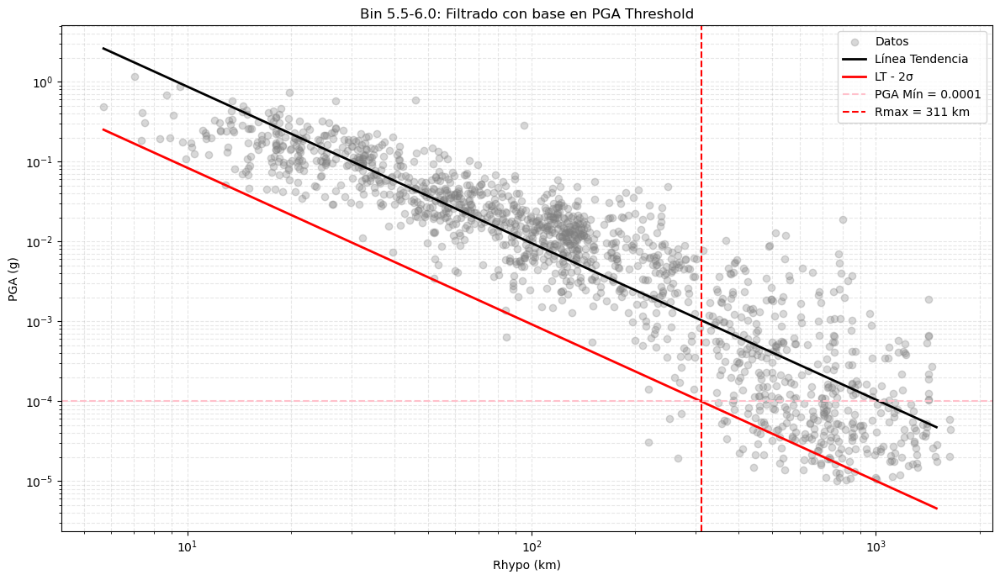

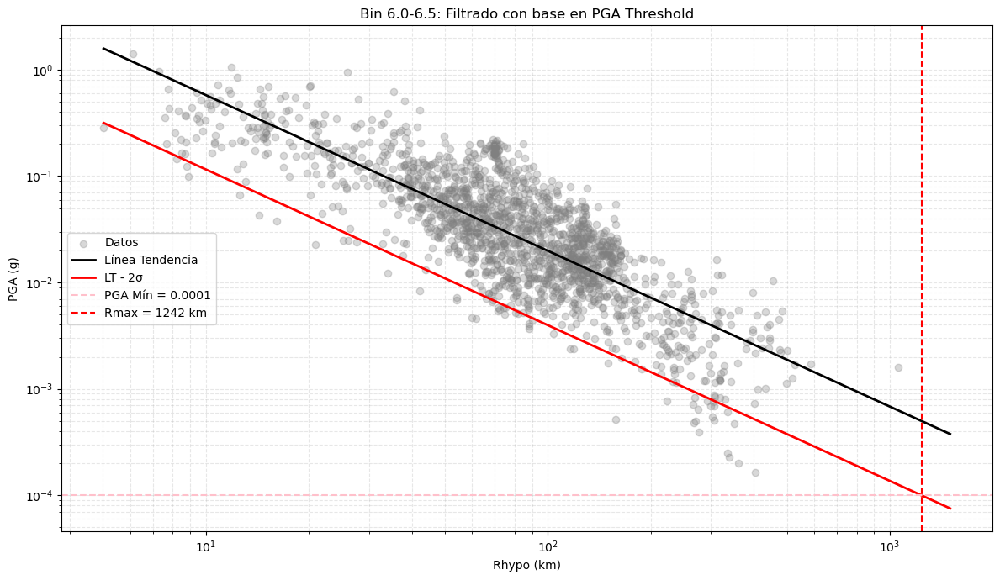

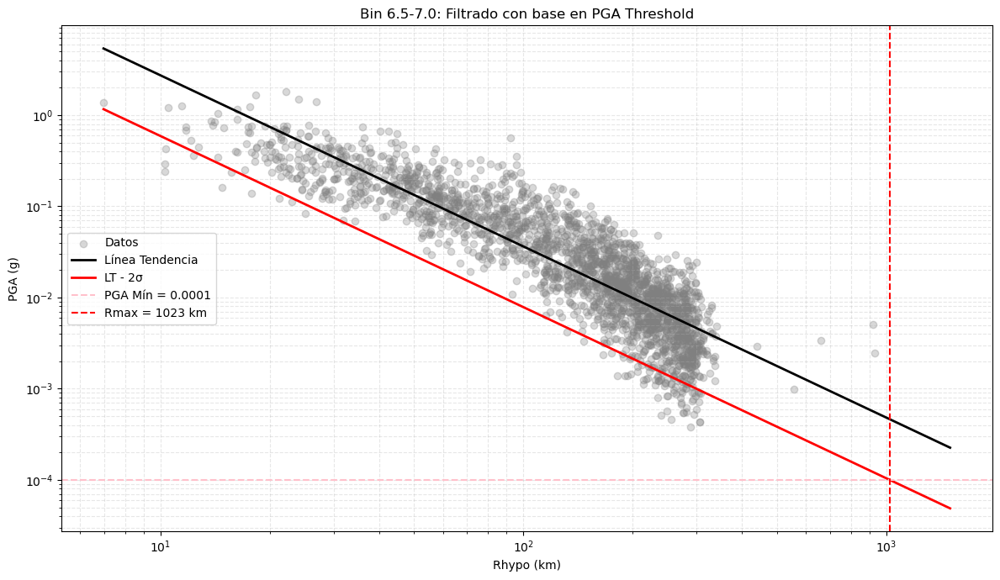

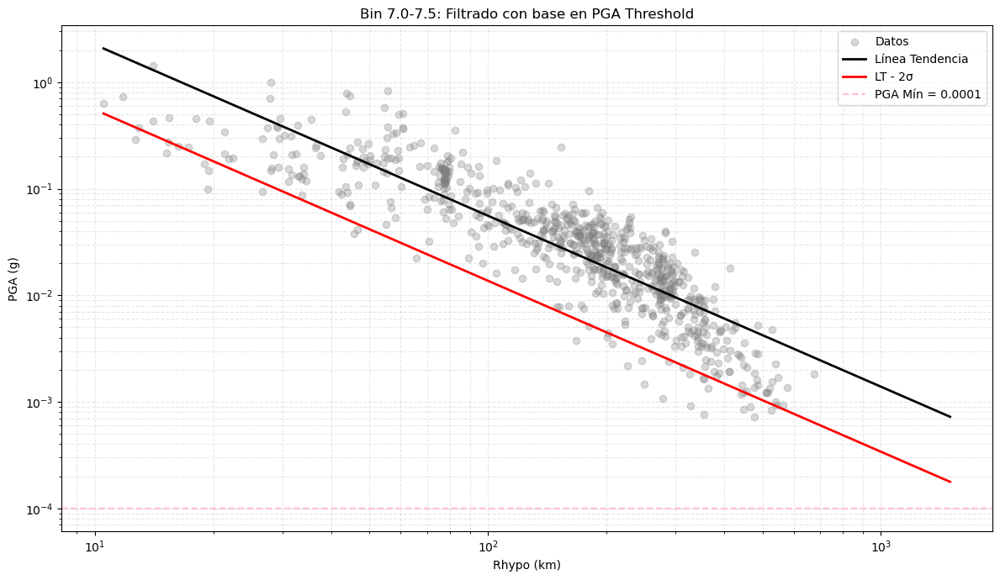

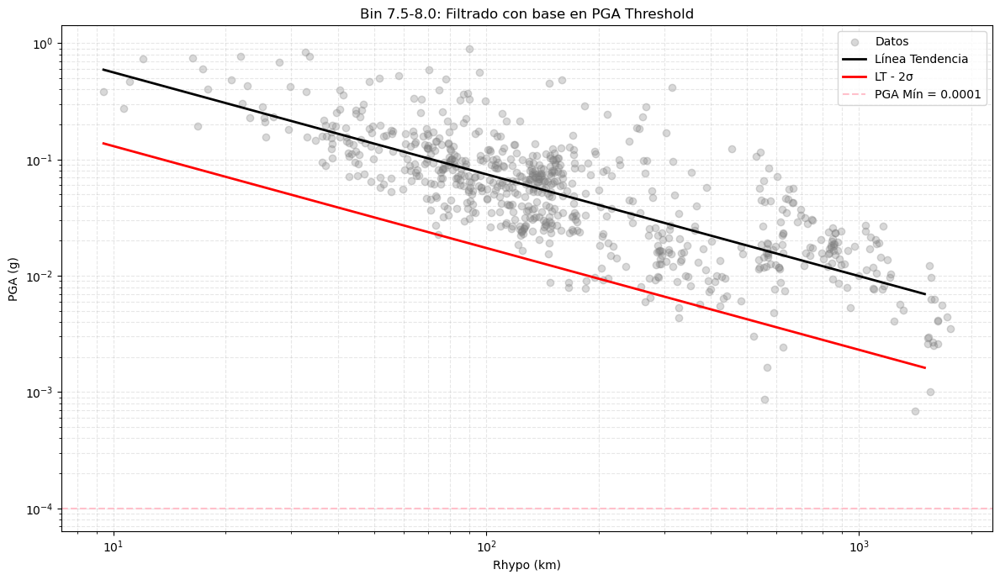

Resultados Rmax por bin:
3.0-3.5: 35.62906404860754
3.5-4.0: 42.79466013240592
4.0-4.5: 76.0450541153358
4.5-5.0: 118.97322286109743
5.0-5.5: 201.11636081673532
5.5-6.0: 311.2590138828386
6.0-6.5: 1242.5723936272595
6.5-7.0: 1023.9824377662434
7.0-7.5: None
7.5-8.0: None


In [52]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.linear_model import LinearRegression

# Definimos función para aplicar tu lógica
def analizar_bin(df, label, pga_min=1e-4, columna_x="Rhypo_OpenQuake", columna_y="T_0.01_RotD50"):
    x = df[columna_x]
    y = df[columna_y]
    
    # Filtrar datos sin NA y aplicar log10
    x_log = np.log10(x)
    y_log = np.log10(y)
    mask = (x_log.notna()) & (y_log.notna())
    x_log = x_log[mask].values.reshape(-1, 1)
    y_log = y_log[mask].values
    
    if len(x_log) < 10:  # evitar bins vacíos
        print(f"Bin {label} sin suficientes datos.")
        return None
    
    # Modelo de regresión lineal (log-log)
    modelo = LinearRegression()
    modelo.fit(x_log, y_log)
    
    # Línea de tendencia
    x_pred = np.logspace(np.log10(x.min()), np.log10(1500), 1000)
    x_pred_log = np.log10(x_pred).reshape(-1, 1)
    y_pred_log = modelo.predict(x_pred_log)
    
    # Desviación estándar de los residuos (hasta 20,000 km)
    residuos = y_log - modelo.predict(x_log)
    residuos_limite = residuos[x[mask].values <= 20000]
    sigma = np.std(residuos_limite)
    y_pred_log_2sigma = y_pred_log - 2 * sigma
    
    # Calcular intersección con PGA mínimo
    pga_min_log = np.log10(pga_min)
    idx_interseccion = np.where(y_pred_log_2sigma <= pga_min_log)[0]
    R_max = x_pred[idx_interseccion[0]] if len(idx_interseccion) > 0 else None
    
    # --- Gráfico ---
    plt.figure(figsize=(12, 7))
    plt.scatter(x, y, alpha=0.3, label="Datos", color='gray')
    plt.plot(x_pred, 10**y_pred_log, color='black', label="Línea Tendencia", linewidth=2)
    plt.plot(x_pred, 10**y_pred_log_2sigma, color='red', label="LT - 2σ", linewidth=2)
    plt.axhline(y=pga_min, color='pink', linestyle='--', label=f"PGA Mín = {pga_min:g}")
    
    if R_max:
        plt.axvline(x=R_max, color='red', linestyle='--', label=f"Rmax = {int(R_max)} km")
    
    plt.xscale("log")
    plt.yscale("log")
    plt.xlabel("Rhypo (km)")
    plt.ylabel("PGA (g)")
    plt.title(f"Bin {label}: Filtrado con base en PGA Threshold")
    plt.grid(True, which='both', linestyle='--', alpha=0.3)
    plt.legend()
    plt.tight_layout()
    plt.show()
    
    return R_max

# --- Diccionario con tus dataframes ---
bins_dict = {
    "3.0-3.5": df_30_35,
    "3.5-4.0": df_35_40,
    "4.0-4.5": df_40_45,
    "4.5-5.0": df_45_50,
    "5.0-5.5": df_50_55,
    "5.5-6.0": df_55_60,
    "6.0-6.5": df_60_65,
    "6.5-7.0": df_65_70,
    "7.0-7.5": df_70_75,
    "7.5-8.0": df_75_80
}

# --- Iterar sobre todos los bins ---
Rmax_results = {}
for label, df_bin in bins_dict.items():
    Rmax_results[label] = analizar_bin(df_bin, label)

# Ver resultados
print("Resultados Rmax por bin:")
for label, rmax in Rmax_results.items():
    print(f"{label}: {rmax}")


In [53]:
# Filtrar cada bin con su respectivo Rmax
df30_35 = df_30_35[df_30_35['Rhypo_OpenQuake'] <= Rmax_results["3.0-3.5"]]
df35_40 = df_35_40[df_35_40['Rhypo_OpenQuake'] <= Rmax_results["3.5-4.0"]]
df40_45 = df_40_45[df_40_45['Rhypo_OpenQuake'] <= Rmax_results["4.0-4.5"]]
df45_50 = df_45_50[df_45_50['Rhypo_OpenQuake'] <= Rmax_results["4.5-5.0"]]
df50_55 = df_50_55[df_50_55['Rhypo_OpenQuake'] <= Rmax_results["5.0-5.5"]]
df55_60 = df_55_60[df_55_60['Rhypo_OpenQuake'] <= Rmax_results["5.5-6.0"]]
df60_65 = df_60_65[df_60_65['Rhypo_OpenQuake'] <= Rmax_results["6.0-6.5"]]
df65_70 = df_65_70[df_65_70['Rhypo_OpenQuake'] <= Rmax_results["6.5-7.0"]]
#df70_75 = df_70_75[df_70_75['Rhypo_OpenQuake'] <= Rmax_results["7.0-7.5"]]
#df75_80 = df_75_80[df_75_80['Rhypo_OpenQuake'] <= Rmax_results["7.5-8.0"]]
df70_75 = df_70_75
df75_80 = df_75_80
# Concatenar todos los bins ya filtrados
df_total2 = pd.concat(
    [df30_35, df35_40, df40_45, df45_50, df50_55,
     df55_60, df60_65, df65_70, df70_75, df75_80],
    ignore_index=True
)

# Copiar y aplicar filtro final de PGA
df_total = df_total2.copy()
df_total = df_total[df_total['T_0.01_RotD50'] > 1e-4]



### Transformación logarítmica a variables de respuesta

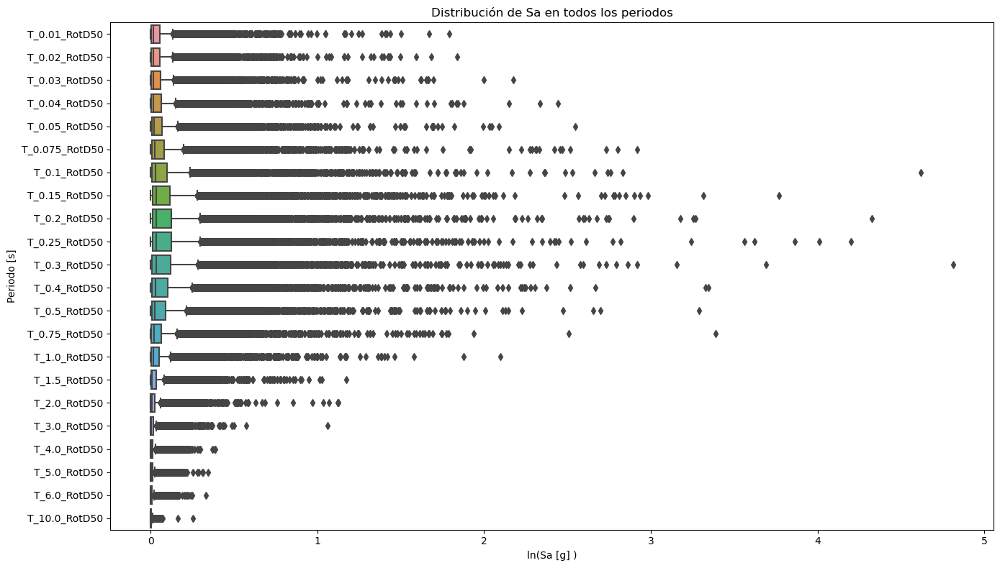

In [54]:
plt.figure(figsize=(14, 8))
sns.boxplot(data=df_total.filter(like="T_"), showfliers=True, orient="h")
#plt.xscale("log")
plt.xlabel("ln(Sa [g] )")
plt.ylabel("Periodo [s]")
plt.title("Distribución de Sa en todos los periodos")
plt.tight_layout()
plt.show()

Como se puede observar con los diagramas de cajas, las distribuciones se ven muy asimetricas, por esa razón a todas las aceleraciones espectrales se les debe aplicar la transformación logaritmica. <br>
Esta transformación permitirá que no existan tantos outliers por parte de la derecha (valores grandes) pero podría conllevar a que se pronuncien los outliers de la parte izquierda (valores pequeños).

In [55]:
Sa_Crustal = ['T_0.01_RotD50', 'T_0.02_RotD50', 'T_0.03_RotD50', 'T_0.04_RotD50',
       'T_0.05_RotD50','T_0.075_RotD50','T_0.1_RotD50','T_0.15_RotD50','T_0.2_RotD50','T_0.25_RotD50','T_0.3_RotD50',
        'T_0.4_RotD50','T_0.5_RotD50','T_0.75_RotD50','T_1.0_RotD50','T_1.5_RotD50','T_2.0_RotD50','T_3.0_RotD50',
        'T_4.0_RotD50','T_5.0_RotD50','T_6.0_RotD50','T_10.0_RotD50']

In [56]:
df_total[Sa_Crustal] = np.log(df_total[Sa_Crustal])

In [57]:
df_total

,Seismic Latitude,Seismic Longitude,Station Latitude,Station Longitude,Hypocenter Depth (km),Magnitude,Rhypo_OpenQuake,Rrup_OpenQuake,Soil_Class,T_0.01_RotD50,...,T_0.75_RotD50,T_1.0_RotD50,T_1.5_RotD50,T_2.0_RotD50,T_3.0_RotD50,T_4.0_RotD50,T_5.0_RotD50,T_6.0_RotD50,T_10.0_RotD50,origen
0,37.1173,-121.5231,37.1635,-121.6265,7.213,3.4,12.75630,12.22,2,-6.819442,...,-7.670238,-8.604075,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NGAW2
1,37.1173,-121.5231,37.0492,-121.8072,7.213,3.4,27.33596,27.03,3,-6.369086,...,-7.574485,-8.277818,-9.612591,NaN,NaN,NaN,NaN,NaN,NaN,NGAW2
2,37.1173,-121.5231,36.9275,-121.8276,7.213,3.4,35.07003,34.85,3,-5.961014,...,-7.619172,-8.039928,-9.403020,NaN,NaN,NaN,NaN,NaN,NaN,NGAW2
3,37.1173,-121.5231,37.1543,-121.7347,7.213,3.4,20.55230,20.07,3,-5.323799,...,-8.020210,-8.676482,-9.725117,NaN,NaN,NaN,NaN,NaN,NaN,NGAW2
4,36.6008,-121.2089,36.6181,-121.3147,8.469,3.4,12.84512,12.51,3,-2.696168,...,-6.271005,-6.885943,-7.710530,-8.315424,NaN,NaN,NaN,NaN,NaN,NGAW2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10241,30.9860,103.3640,36.4000,103.8000,10.040,7.9,609.00000,441.95,3,-4.435628,...,-4.076344,-4.330397,-4.476112,-4.421550,-4.864837,-4.916684,-4.692053,-4.500051,-5.238266,NGAW2
10242,30.9860,103.3640,35.8000,104.1000,10.040,7.9,537.99000,362.18,3,-4.283697,...,-3.661506,-3.730113,-4.172560,-4.000966,-4.461685,-4.800822,-4.712710,-4.772605,-5.189738,NGAW2
10243,30.9860,103.3640,35.8000,103.9000,10.040,7.9,540.10000,376.08,2,-4.434821,...,-3.587891,-3.673767,-3.946649,-3.906603,-4.878867,-5.130101,-5.099088,-4.753753,-5.052122,NGAW2
10244,30.9860,103.3640,36.0000,103.3000,10.040,7.9,556.05000,416.48,3,-4.438374,...,-4.239994,-3.949010,-4.470734,-4.827834,-5.071553,-5.323319,-5.496639,-5.030693,-5.482658,NGAW2


### Por qué no se deben imputar NaNs en las aceleraciones espectrales.

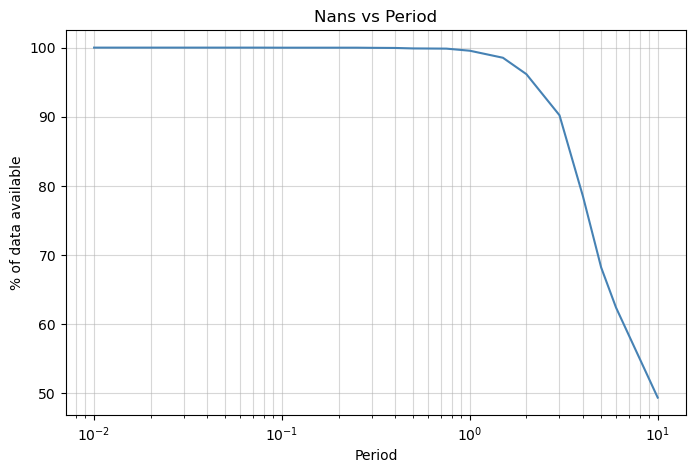

In [58]:
# Extraer solo las columnas de periodo
period_cols = [c for c in Sa_Crustal if c.startswith("T_") and c.endswith("_RotD50")]

# Calcular % de NaNs por columna
missing_pct = 100-df_total[period_cols].isna().mean() * 100

# Convertir nombres de columnas a valores numéricos de periodo
periods = [float(c.split("_")[1]) for c in period_cols]

# Graficar
plt.figure(figsize=(8,5))
plt.plot(periods, missing_pct, linestyle="-", color="steelblue")

plt.xscale("log")  
plt.xlabel("Period")
plt.ylabel("% of data available")
plt.title("Nans vs Period")
plt.grid(True, which="both", linestyle="-", alpha=0.5)

plt.show()


Es notorio que a medida que los periodos incrementan, se va perdiendo información sobre valores de sus correspondientes aceleraciones espectrales.

Text(0.5, 1.0, 'Boxplot Sa(10s) - full dataset')

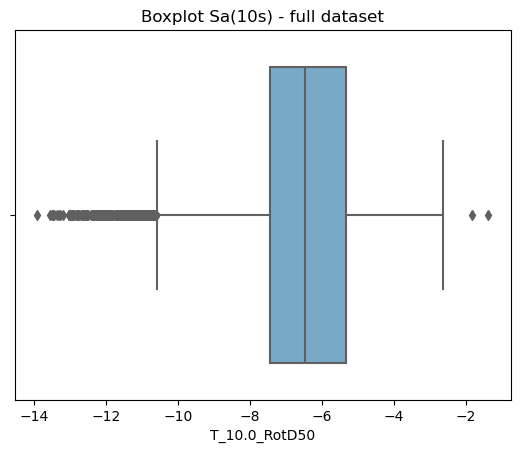

In [59]:
sns.boxplot(x="T_10.0_RotD50", data=df_total, palette='Blues')
plt.title("Boxplot Sa(10s) - full dataset")

In [60]:
print("Desviación estándar:", df_total["T_10.0_RotD50"].std(skipna=True))

Desviación estándar: 1.7929025825357678


Como se puede observar, existe una gran dispersión de los datos para periodos donde las pérdidas empiezan a ser mayores. Indicando así que cualquier tipo de imputación vaya a afectar considerablemente a la distribución de los datos 

In [61]:
col = "T_10.0_RotD50"

median_global = df_total[col].median(skipna=True)
print("Mediana global usada para imputar:", median_global)
df_imputed = df_total.copy()
df_imputed["T_10.0_RotD50_imputed"] = df_total[col].fillna(median_global)

Mediana global usada para imputar: -6.476257318594798


Text(0.5, 1.0, 'Boxplot Sa(10s) - full dataset')

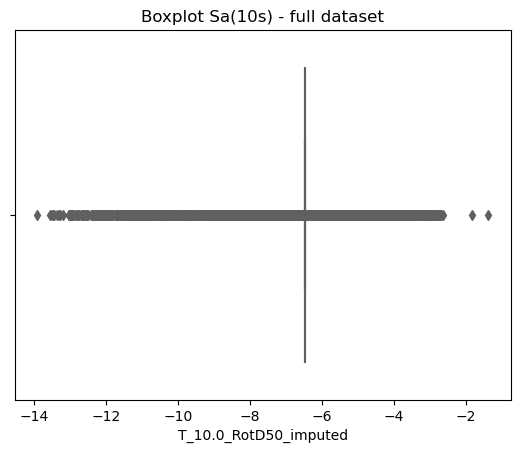

In [62]:
sns.boxplot(x="T_10.0_RotD50_imputed", data=df_imputed, palette='Blues')
plt.title("Boxplot Sa(10s) - full dataset")

In [63]:
print("Desviación estándar:", df_imputed["T_10.0_RotD50_imputed"].std(skipna=True))

Desviación estándar: 1.2610849379178952


Como se puede evidenciar, uno de los métodos de imputación mas usados, (mediana) no sería del todo funcional ya que esto haría que el entrenamiento luego sea sesgado. La desviación estándar cayó casi un 29% que es una compresión bastante relevante

<Axes: xlabel='T_10.0_RotD50_knn'>

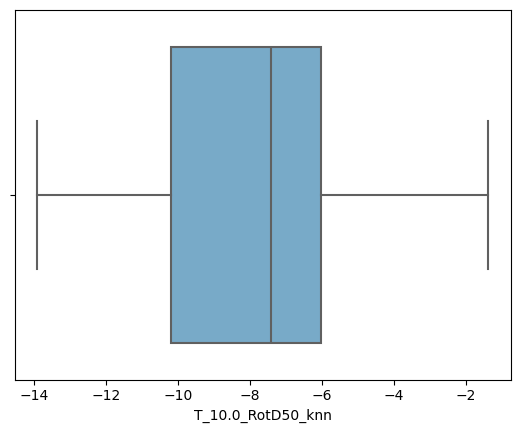

In [64]:
from sklearn.impute import KNNImputer
from sklearn.preprocessing import StandardScaler

predictors = ["Magnitude", "Rrup_OpenQuake", "Rhypo_OpenQuake", "Soil_Class"]

df_imputed["T_10.0_RotD50_knn"] = df_total["T_10.0_RotD50"]

scaler = StandardScaler()
X = scaler.fit_transform(df_imputed[predictors])

import numpy as np
import pandas as pd
X_all = np.column_stack([X, df_imputed["T_10.0_RotD50_knn"]])

imp = KNNImputer(n_neighbors=5, weights="distance")
X_imp = imp.fit_transform(X_all)

df_imputed["T_10.0_RotD50_knn"] = X_imp[:, -1]
sns.boxplot(x="T_10.0_RotD50_knn", data=df_imputed, palette='Blues')


In [65]:
print("Desviación estándar:", df_imputed["T_10.0_RotD50_knn"].std(skipna=True))

Desviación estándar: 2.5510032092574435


Haciendo la imputación usando vecinos cercanos, se puede ver que aumenta la desviación estándar a pesar de que gráficamente no se logren observar tantos cambios. La subida representa casi el 42% lo que sigue siendo considerable. <br>
Con esto, una de las razones por las que no se debería imputar valores de Sa faltantes es porque afectarán enormemente la distribución. A esto añadirle que la columna con T= 10.0s no es la única que tiene valores faltantes. Imputar todas las columnas afectará al entrenamiento y predicción de los modelos sesgándolos a datos mas ordenados cuando esto está muy lejos de la realidad.

Además, imputar realmente no tendría sentido ya que el espectro no existiría mas allá de lo que señala la variable de Tmax. Dado caso se imputase, sería equivalente a inventar energía espectral. el proveedor ya dice que para un T > Tmax: “con la parte útil del registro disponible, el contenido a baja frecuencia no es fiable”. por lo tanto no se debería de cambiar la información.

Las bases de datos como el NGA West 2 existen limitaciones de las señales registrada. Un ejemplo de esto es un sismo de Mw (Magnitud) pequeño que no pueda tener contenido energía en periodos largos como 10s, o simplemente no son confiables y se dejan así. <br>
Los NaNs de los Sa(T) son en su mayoría consecuencia natural de los registros.

## EDA Full Dataset

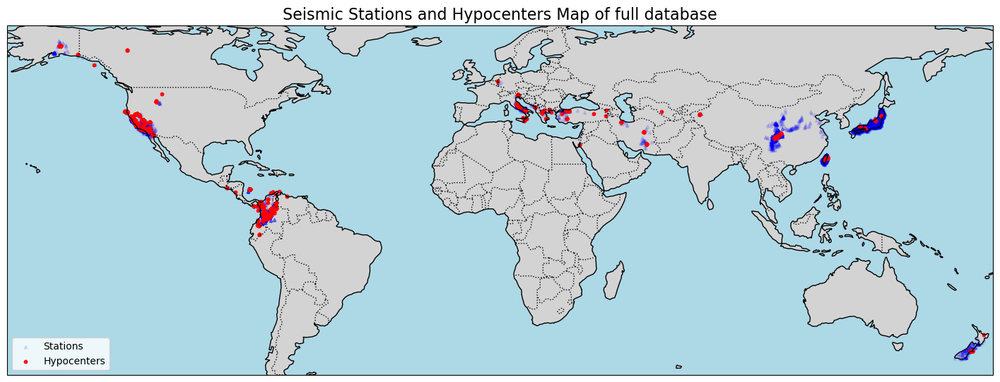

In [66]:
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cfeature

plt.figure(figsize=(18,12))
ax = plt.axes(projection=ccrs.PlateCarree())

# Límites opcionales: norte de Suramérica
# ax.set_extent([-85, -65, -5, 15])  
#ax.set_extent([-50, -50,50, 50])
# Agregar elementos del mapa
ax.add_feature(cfeature.COASTLINE)
ax.add_feature(cfeature.BORDERS, linestyle=':')
ax.add_feature(cfeature.LAND, facecolor='lightgray')
ax.add_feature(cfeature.OCEAN, facecolor='lightblue')

# Estaciones (ej. en azul)
plt.scatter(df_total["Station Longitude"], df_total["Station Latitude"], 
            c="blue", s=10, marker="^",  alpha=0.1,
            label="Stations", transform=ccrs.PlateCarree())

# Hipocentros (ej. en rojo)
plt.scatter(df_total["Seismic Longitude"], df_total["Seismic Latitude"], 
            c="red", s=10, marker="o", alpha=0.9,
            label="Hypocenters", transform=ccrs.PlateCarree())

# Título y leyenda
plt.title("Seismic Stations and Hypocenters Map of full database", fontsize=16)
plt.legend(loc="lower left")

plt.show()

In [67]:
df_total.drop(columns=['Seismic Latitude', 'Seismic Longitude', 'Station Latitude','Station Longitude'], inplace=True)

In [68]:
inputs = df_total.columns[0:5].append(df.columns[[31]])

In [69]:
inputs

Index(['Hypocenter Depth (km)', 'Magnitude', 'Rhypo_OpenQuake',
       'Rrup_OpenQuake', 'Soil_Class', 'origen'],
      dtype='object')

In [70]:
df_total.describe().T

,count,mean,std,min,25%,50%,75%,max
Hypocenter Depth (km),10239.0,10.611286,5.111330,1.331000,7.507000,10.000000,13.300000,58.700000
Magnitude,10239.0,5.912488,1.139730,3.200000,5.170000,6.200000,6.800000,7.900000
Rhypo_OpenQuake,10239.0,119.541344,131.800992,2.060000,40.642415,80.930000,160.440000,1754.710000
Rrup_OpenQuake,10239.0,105.479980,111.016187,0.050000,34.933995,71.480000,145.280000,1532.660000
Soil_Class,10239.0,3.112609,0.746363,1.000000,3.000000,3.000000,3.000000,5.000000
T_0.01_RotD50,10239.0,-4.115497,1.698535,-9.089584,-5.246313,-4.076789,-2.871488,0.583978
T_0.02_RotD50,10239.0,-4.106722,1.702470,-9.099407,-5.235583,-4.068201,-2.861099,0.608868
T_0.03_RotD50,10239.0,-4.073375,1.708772,-9.092691,-5.210306,-4.043861,-2.831311,0.776301
T_0.04_RotD50,10239.0,-4.019957,1.715959,-9.081982,-5.164630,-4.009344,-2.751257,0.893668
T_0.05_RotD50,10239.0,-3.952011,1.724397,-9.068641,-5.109774,-3.952898,-2.681297,0.934476


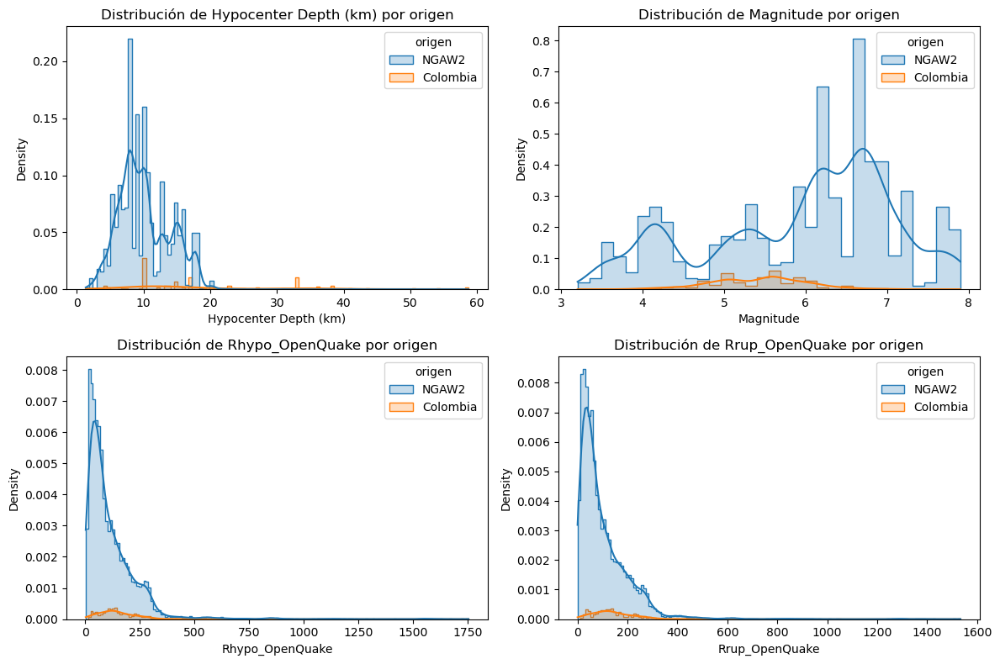

In [71]:
variables = ['Hypocenter Depth (km)', 'Magnitude', 'Rhypo_OpenQuake', 'Rrup_OpenQuake']

fig, axes = plt.subplots(2, 2, figsize=(12, 8))  # 2 filas x 2 columnas
axes = axes.flatten()  # pasar a arreglo 1D para iterar fácil

for i, var in enumerate(variables):
    sns.histplot(data=df_total, x=var, hue="origen", kde=True,
                 element="step", stat="density", ax=axes[i])
    axes[i].set_title(f"Distribución de {var} por origen")

plt.tight_layout()
plt.show()


Se puede ver la gran diferencia de densidades, ciertamente porque el NGAWest2 tiene una cantidad mayor considerable con respecto a la de Colombia, sin embargo el hecho de que aún estén sin la transformación logarítmica afecta al cálculo de la densidad para las variables de distancia.

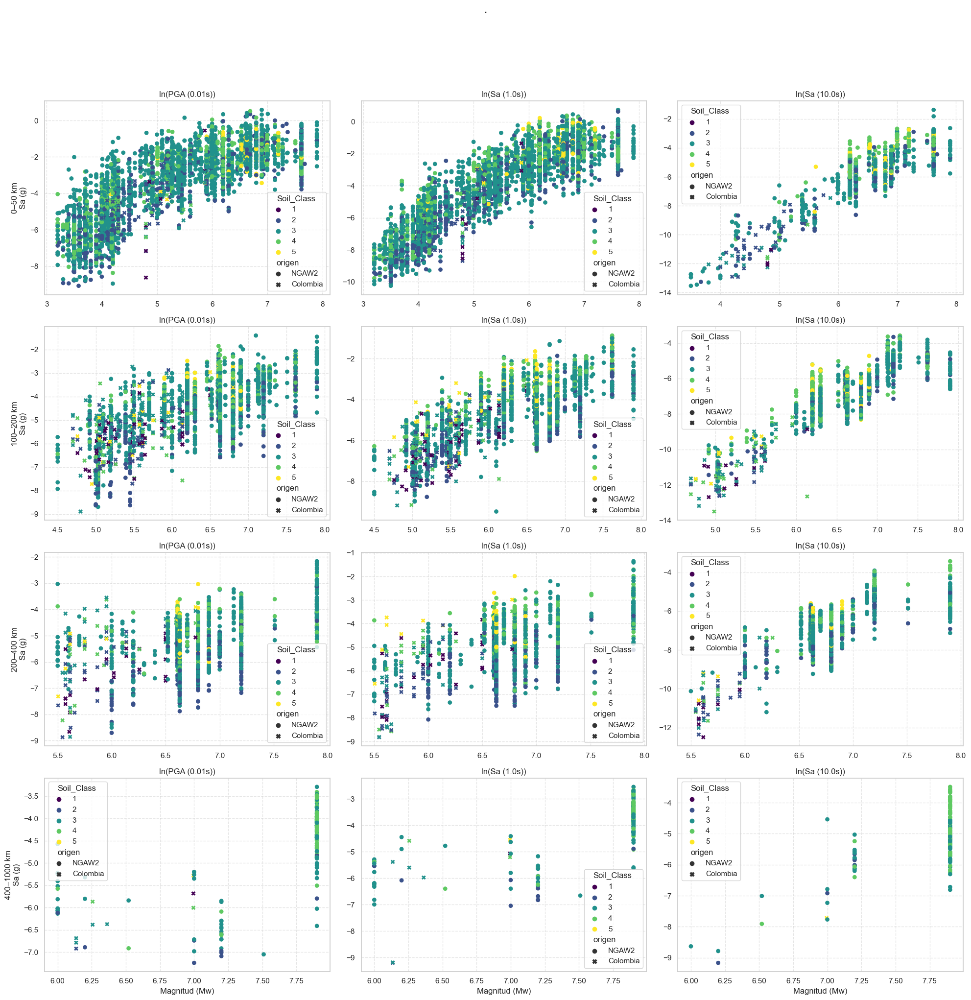

In [72]:
sns.set(style="whitegrid")

# Variables
col_y = ['T_0.01_RotD50', 'T_1.0_RotD50', 'T_10.0_RotD50']
titles_y = ['ln(PGA (0.01s))', 'ln(Sa (1.0s))', 'ln(Sa (10.0s))']
rrup_bins = [(0, 50), (100, 200), (200, 400), (400, 1000)]

# Crear figura 4x3
fig, axes = plt.subplots(4, 3, figsize=(20, 20), )#sharey='col')

# Graficar
for row, (rmin, rmax) in enumerate(rrup_bins):
    subset = df_total[(df_total["Rrup_OpenQuake"] >= rmin) & (df_total["Rrup_OpenQuake"] < rmax)]
    
    for col, y_var in enumerate(col_y):
        ax = axes[row, col]
        sns.scatterplot(
            data=subset,
            x='Magnitude',
            y=y_var,
            hue='Soil_Class',
            style='origen',
            palette='viridis',
            s=40,
            edgecolor='none',
            ax=ax
        )
        #ax.set_yscale('log')
        if row == 3:
            ax.set_xlabel("Magnitud (Mw)")
        else:
            ax.set_xlabel("")
        if col == 0:
            ax.set_ylabel(f"{rmin}–{rmax} km\nSa (g)")
        else:
            ax.set_ylabel("")
        ax.set_title(titles_y[col])
        ax.grid(True, which='both', linestyle='--', alpha=0.5)

# Leyenda fuera del grid
handles, labels = axes[0, 0].get_legend_handles_labels()
#fig.legend(handles, labels, loc='upper center', ncol=6, frameon=False)

plt.suptitle(".", fontsize=16, y=1.02)
plt.tight_layout(rect=[0, 0, 1, 0.96])
plt.show()

La figura evidencia la relación positiva entre la magnitud y la intensidad del movimiento del suelo, mostrando que a mayor Mw se incrementan los valores de PGA y de Sa en distintos periodos, aunque con una dispersión creciente hacia periodos largos (1.0–10.0 s). Se observa además que las clases de suelo influyen en la respuesta, con suelos más blandos tendiendo a registrar mayores amplitudes, aunque con un traslape considerable que indica que el efecto de sitio no se explica únicamente por la clasificación general de suelos. La comparación entre los registros de la base NGA-West2 y los de Colombia muestra comportamientos consistentes en la tendencia global, pero con mayor dispersión en los datos locales, lo que resalta la importancia de contar con bases regionalizadas que permitan ajustar los modelos de predicción a las condiciones propias, a la vez que confirma la necesidad de incrementar la cantidad y calidad de registros para reducir la variabilidad, especialmente en periodos largos.

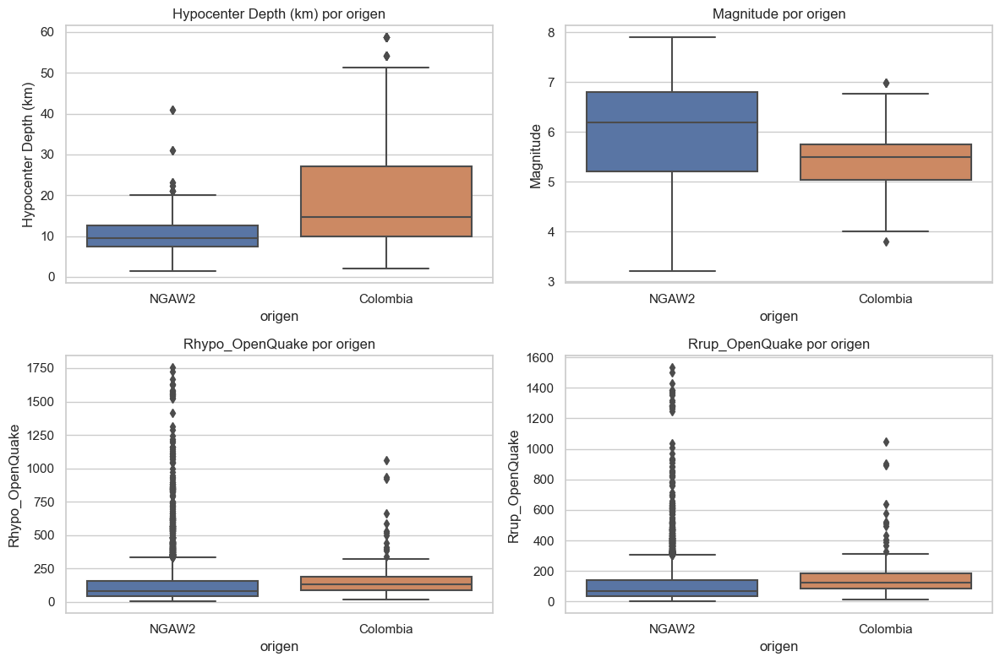

In [73]:
variables = ['Hypocenter Depth (km)', 'Magnitude', 'Rhypo_OpenQuake', 'Rrup_OpenQuake']

fig, axes = plt.subplots(2, 2, figsize=(12, 8))  # 2 filas x 2 columnas
axes = axes.flatten()

for i, var in enumerate(variables):
    sns.boxplot(data=df_total, x="origen", y=var, ax=axes[i])
    axes[i].set_title(f"{var} por origen")

plt.tight_layout()
plt.show()


La base NGAW2 es más diversa y amplia, con magnitudes mayores y distancias extremas, lo que le da robustez para entrenar modelos globales; en contraste, la base colombiana es más restringida en magnitud y distancia, pero refleja mejor las condiciones locales (mayor profundidad hipocentral y registros más cercanos)

origen    Soil_Class
Colombia  1              110
          2              132
          3              173
          4               78
          5               44
NGAW2     2             1439
          3             5880
          4             1988
          5              395
dtype: int64


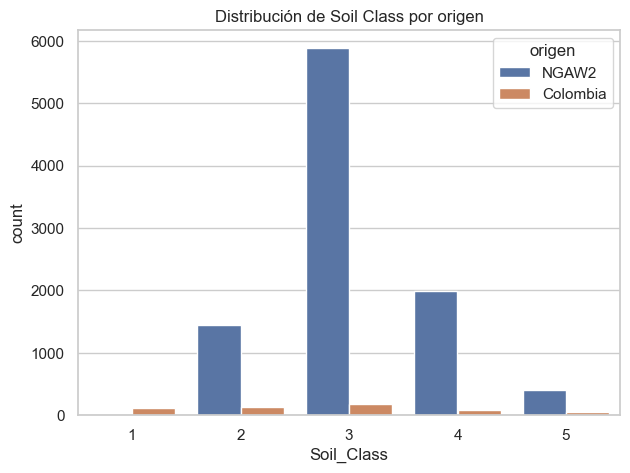

In [74]:
# Conteo absoluto
print(df_total.groupby(['origen', 'Soil_Class']).size())

# Gráfico
plt.figure(figsize=(7,5))
sns.countplot(data=df_total, x='Soil_Class', hue='origen')
plt.title("Distribución de Soil Class por origen")
plt.show()

La figura muestra la distribución de clases de suelo en los conjuntos de datos NGAW2 y Colombia, evidenciando un claro desbalance. En NGAW2 predomina ampliamente la clase 3, con casi 6.000 registros, seguida de la clase 4 y en menor medida las clases 2 y 5, mientras que la clase 1 tiene una representación muy reducida. En contraste, la base de Colombia presenta una cantidad mucho menor de registros en todas las clases, sin un predominio tan marcado, aunque también con ligera mayor presencia en las clases 3 y 4.

Muy importante señalar que no hay registros clasificados como suelo tipo 1 para la base de datos de NGAW2

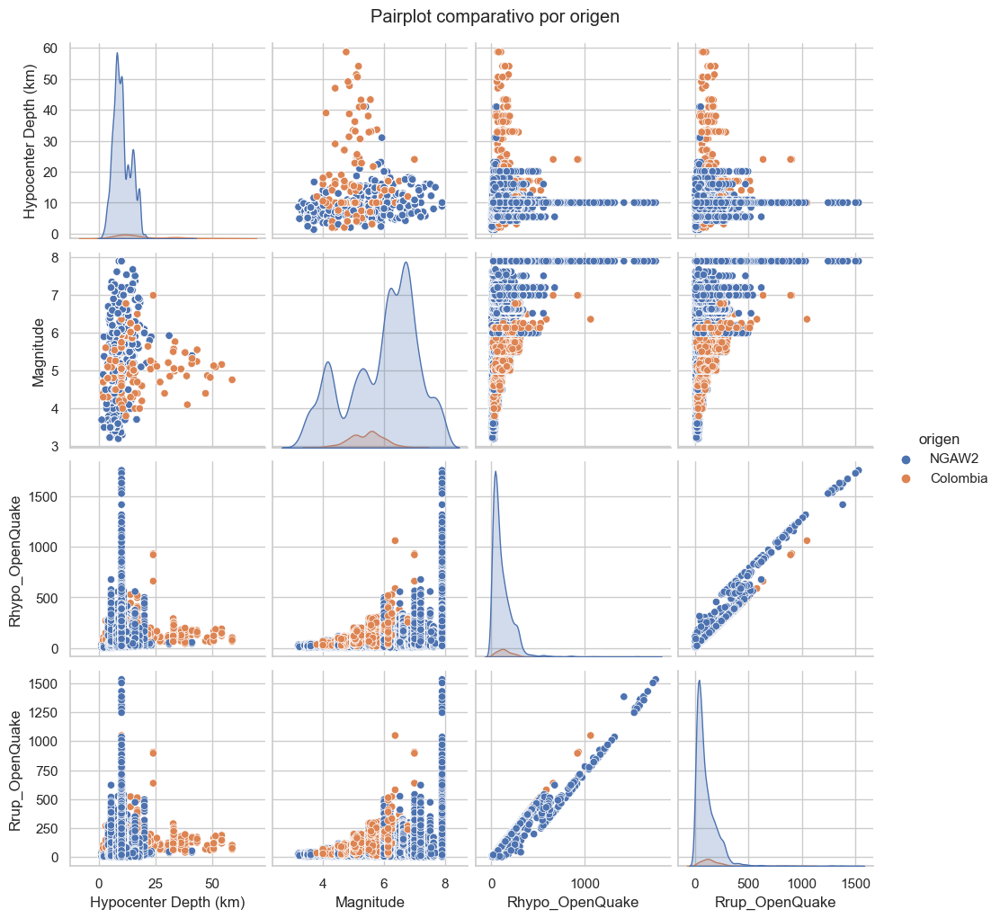

In [75]:
sns.pairplot(df_total, vars=variables, hue="origen", diag_kind="kde")
plt.suptitle("Pairplot comparativo por origen", y=1.02)
plt.show()


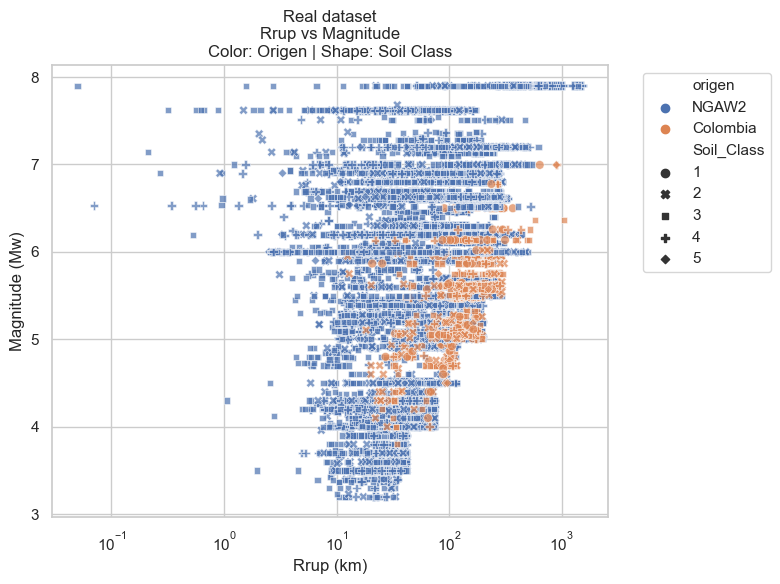

In [76]:
plt.figure(figsize=(8,6))
sns.scatterplot(
    data=df_total,
    x="Rrup_OpenQuake", 
    y="Magnitude",
    hue="origen",          # Color según origen
    style="Soil_Class",    # Marcador según tipo de suelo
    alpha=0.7,             # Transparencia para ver densidad
    s=40                  # Tamaño de puntos
)

plt.xscale("log")  # Escala logarítmica en X
plt.title("Real dataset\nRrup vs Magnitude\nColor: Origen | Shape: Soil Class")
plt.xlabel("Rrup (km)")
plt.ylabel("Magnitude (Mw)")
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')  # Mover leyenda afuera
plt.tight_layout()
plt.show()


La figura presenta la relación entre la magnitud (Mw) y la distancia a la ruptura (Rrup) para los registros de NGAW2 y Colombia tras aplicar el filtrado de dos veces la desviación estándar,y el umbral de PGA >1e-4, lo que explica la forma escalonada del conjunto de datos. Se observa que los datos de NGAW2 (en azul) cubren un rango mucho más amplio tanto en magnitudes como en distancias, mientras que los registros de Colombia (en naranja) se concentran principalmente entre magnitudes 4.5 y 6.5, y en distancias intermedias (10–200 km). Este filtrado resalta una nube de puntos más densa y ordenada, lo cual facilita identificar tendencias generales: a medida que aumenta la magnitud, se registran distancias a la ruptura mayores y con mayor dispersión. Asimismo, se evidencia la persistencia de las distintas clases de suelo, aunque sin un patrón claramente diferenciado en esta escala.

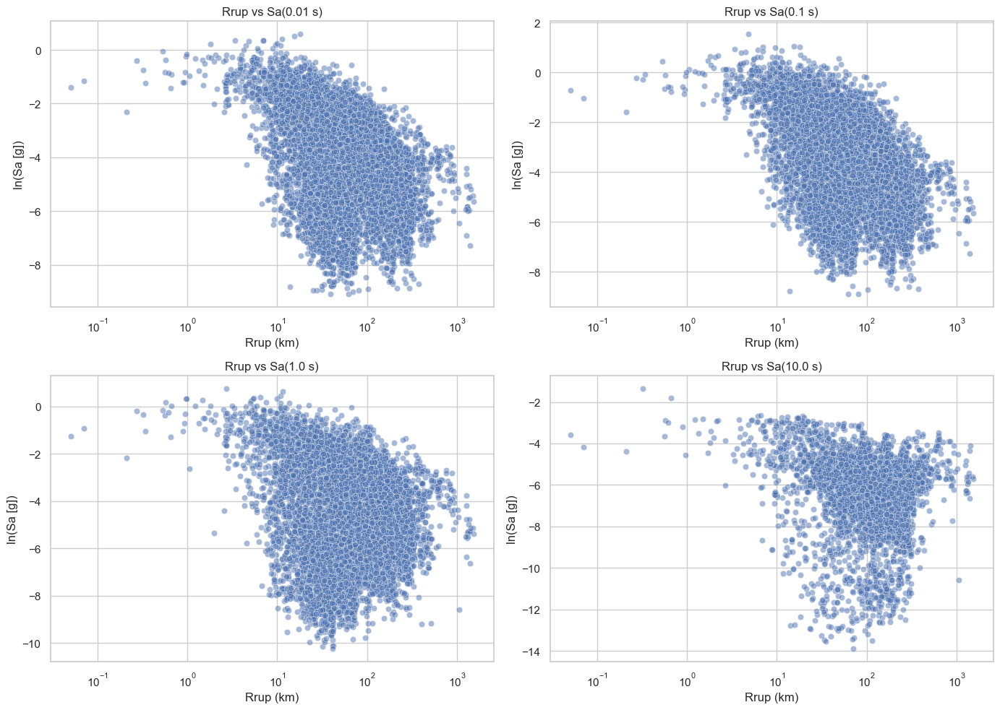

In [77]:
# --- 4. Sa(T) vs Distancia (Rrup) ---
fig, axes = plt.subplots(2, 2, figsize=(14,10))
for ax, col in zip(axes.flatten(), periodos_ref):
    sns.scatterplot(x="Rrup_OpenQuake", y=col, data=df_total, alpha=0.5, ax=ax)
    ax.set_xscale("log")
    #ax.set_yscale("log")
    ax.set_title(f"Rrup vs Sa({col.split('_')[1]} s)")
    ax.set_xlabel("Rrup (km)")
    ax.set_ylabel("ln(Sa [g])")
plt.tight_layout()
plt.show()

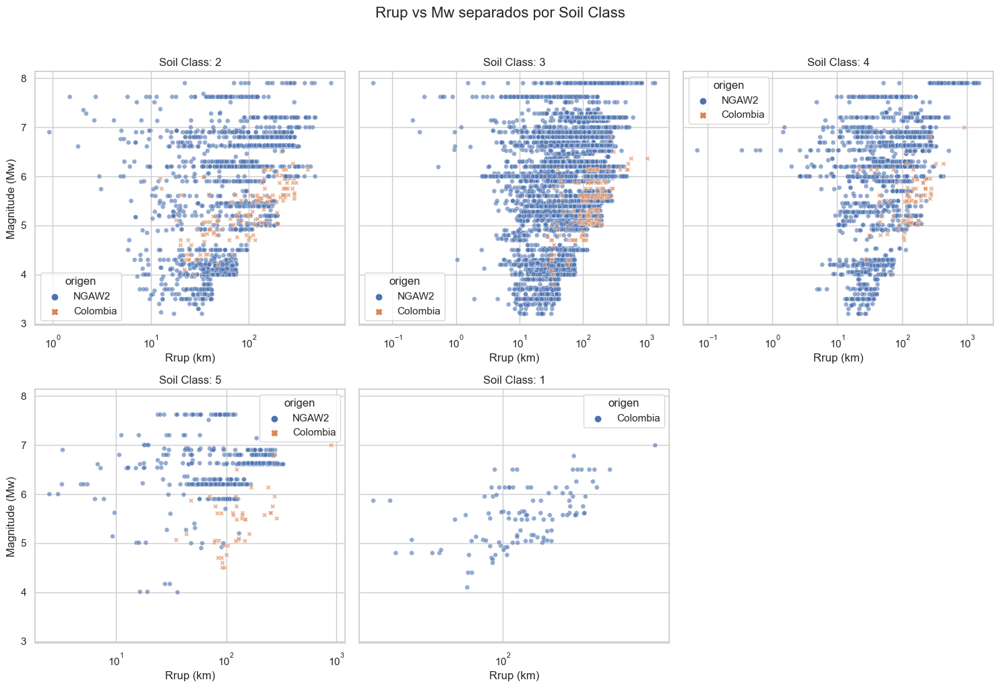

In [78]:
soil_classes = df_total['Soil_Class'].unique()[:5]  # tomar 5 tipos de suelo
fig, axes = plt.subplots(2, 3, figsize=(15, 10), sharey=True)
axes = axes.flatten()

for i, soil in enumerate(soil_classes):
    subset = df_total[df_total['Soil_Class'] == soil]
    sns.scatterplot(
        data=subset,
        x="Rrup_OpenQuake", 
        y="Magnitude",
        hue="origen",      
        style="origen",    
        alpha=0.6,
        s=25,
        ax=axes[i]
    )
    axes[i].set_xscale("log")
    axes[i].set_title(f"Soil Class: {soil}")
    axes[i].set_xlabel("Rrup (km)")
    if i % 3 == 0:  # primera columna de cada fila muestra Y label
        axes[i].set_ylabel("Magnitude (Mw)")
    else:
        axes[i].set_ylabel("")

# Usar el subplot 6 para la leyenda
axes[-1].axis("off")  # lo apagamos

plt.suptitle("Rrup vs Mw separados por Soil Class", y=1.02, fontsize=16)
plt.tight_layout()
plt.show()


La figura muestra la relación entre la magnitud (Mw) y la distancia a la ruptura (Rrup) separada por clases de suelo, comparando los registros de NGAW2 y Colombia. En general, se observa que los datos de NGAW2 (azul) cubren un rango mucho más amplio de magnitudes y distancias en todas las clases, mientras que los registros colombianos (naranja) se concentran en magnitudes intermedias (4.5–6.5) y distancias moderadas (10–200 km). En la clase 3, que es la más poblada, ambos conjuntos siguen una tendencia similar, aunque la base colombiana muestra menor dispersión. En las clases 2 y 4 también existe correspondencia, pero los datos locales son mucho más escasos y con menos cobertura en magnitudes altas. La clase 5 presenta aún menos registros, lo que limita la caracterización de suelos muy blandos, y en la clase 1 solo aparecen registros de Colombia.

### Transformación logarítmica de Rhypo y Rrup

In [79]:
df_total['Rhypo_OpenQuake'] = np.log(df_total['Rhypo_OpenQuake'])  # +1 para evitar log(0)
df_total['Rrup_OpenQuake'] = np.log(df_total['Rrup_OpenQuake'])  

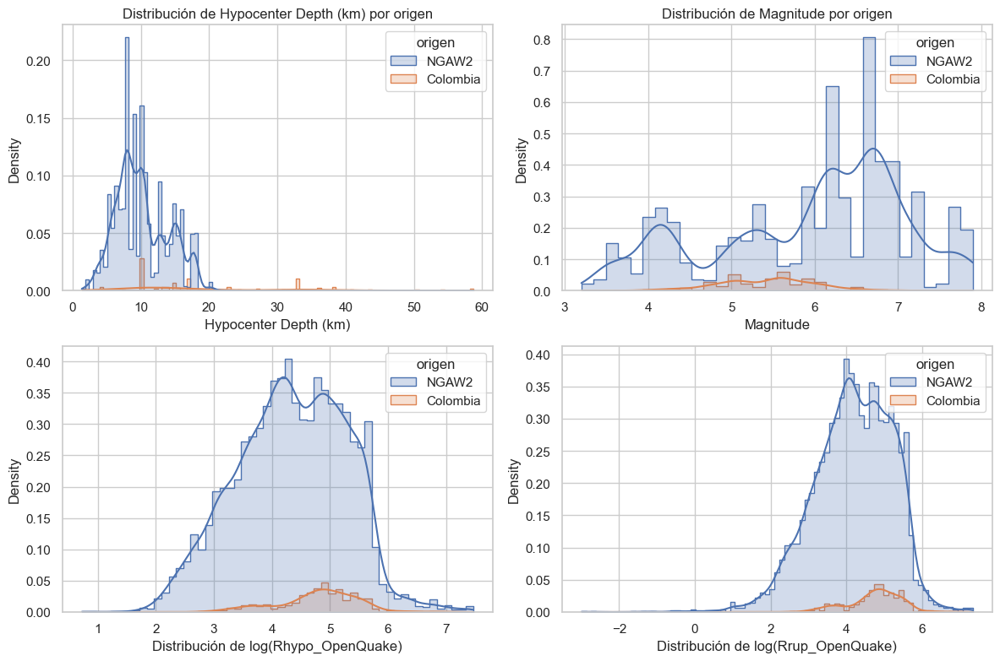

In [80]:
fig, axes = plt.subplots(2, 2, figsize=(12, 8))  # 2 filas x 2 columnas
axes = axes.flatten()  # pasar a arreglo 1D para iterar fácil

for i, var in enumerate(variables):
    sns.histplot(data=df_total, x=var, hue="origen", kde=True,
                 element="step", stat="density", ax=axes[i])
    if var in ['Rhypo_OpenQuake', 'Rrup_OpenQuake']:
        axes[i].set_xlabel(f"Distribución de log({var})")
    else:
        axes[i].set_title(f"Distribución de {var} por origen")

plt.tight_layout()
plt.show()


### Prueba de hipotesis para normalidad de variables de respuesta

Dado que el dataset es considerablemente grande, una prueba de hipótesis para la normalidad será muy dificil que arroje una respuesta deseada, y en este caso aún más si se incluye el hecho de que existen valores atípicos. Sin embargo se usará la prueba de Kolmogorov-Smirnov para contrastar y se observará gráficamente con la QQ plot y una superposición entre la curva normal y la curva de densidad de Sa(T)


Análisis para T_0.01_RotD50:
KS test: estadístico=0.0203, p=0.0004

Análisis para T_0.02_RotD50:
KS test: estadístico=0.0198, p=0.0007

Análisis para T_0.03_RotD50:
KS test: estadístico=0.0193, p=0.0009

Análisis para T_0.04_RotD50:
KS test: estadístico=0.0209, p=0.0003

Análisis para T_0.05_RotD50:
KS test: estadístico=0.0223, p=0.0001

Análisis para T_0.075_RotD50:
KS test: estadístico=0.0227, p=0.0001

Análisis para T_0.1_RotD50:
KS test: estadístico=0.0223, p=0.0001

Análisis para T_0.15_RotD50:
KS test: estadístico=0.0207, p=0.0003

Análisis para T_0.2_RotD50:
KS test: estadístico=0.0228, p=0.0000

Análisis para T_0.25_RotD50:
KS test: estadístico=0.0250, p=0.0000

Análisis para T_0.3_RotD50:
KS test: estadístico=0.0224, p=0.0001

Análisis para T_0.4_RotD50:
KS test: estadístico=0.0239, p=0.0000

Análisis para T_0.5_RotD50:
KS test: estadístico=0.0263, p=0.0000

Análisis para T_0.75_RotD50:
KS test: estadístico=0.0356, p=0.0000

Análisis para T_1.0_RotD50:
KS test: estadístico=0.

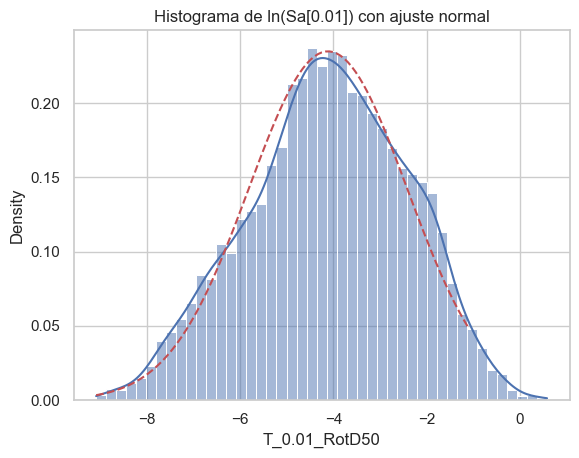

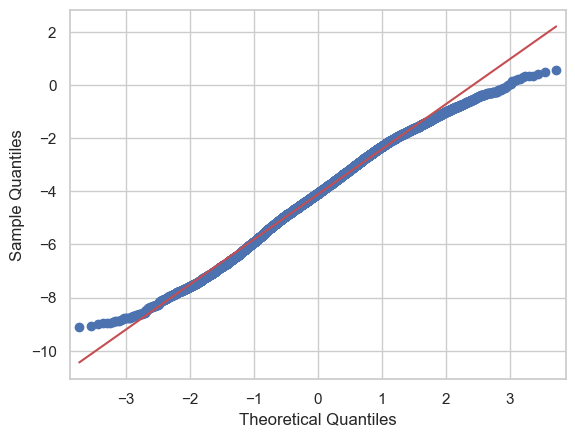

In [81]:
import scipy.stats as stats

# Supongamos que X son tus Sa(T)
for sa in Sa_Crustal[:-1]:
    print(f"\nAnálisis para {sa}:")
    X = df_total[sa].dropna()

    Y = X

    mu, sigma = stats.norm.fit(Y)
    stat, p = stats.kstest(Y, 'norm', args=(mu, sigma))
    print(f"KS test: estadístico={stat:.4f}, p={p:.4f}")


# --- Histograma ---
sns.histplot(df_total['T_0.01_RotD50'].dropna(), kde=True, stat="density")
mu, sigma = stats.norm.fit(df_total['T_0.01_RotD50'].dropna())
x_vals = np.linspace(df_total['T_0.01_RotD50'].dropna().min(), Y.max(), 100)
plt.plot(x_vals, stats.norm.pdf(x_vals, mu, sigma), 'r--')
plt.title("Histograma de ln(Sa[0.01]) con ajuste normal")
plt.show()

# --- QQ-plot ---
import statsmodels.api as sm
sm.qqplot(df_total['T_0.01_RotD50'].dropna(), line='s')
plt.show()



Se evaluó la hipótesis de lognormalidad de Sa(T) aplicando transformaciones logarítmicas y pruebas estadísticas (KS). Los resultados fueron significativos, lo que indica que los datos no siguen estrictamente una distribución normal en log-espacio. Sin embargo, la inspección visual mediante histogramas y QQ-plots muestra que el ajuste es razonable en la mayor parte del dominio, con ligeras desviaciones en las colas. En este sentido, y en concordancia con la literatura (Bommer & Abrahamson, 2006), se considera válida la aproximación lognormal para Sa(T)

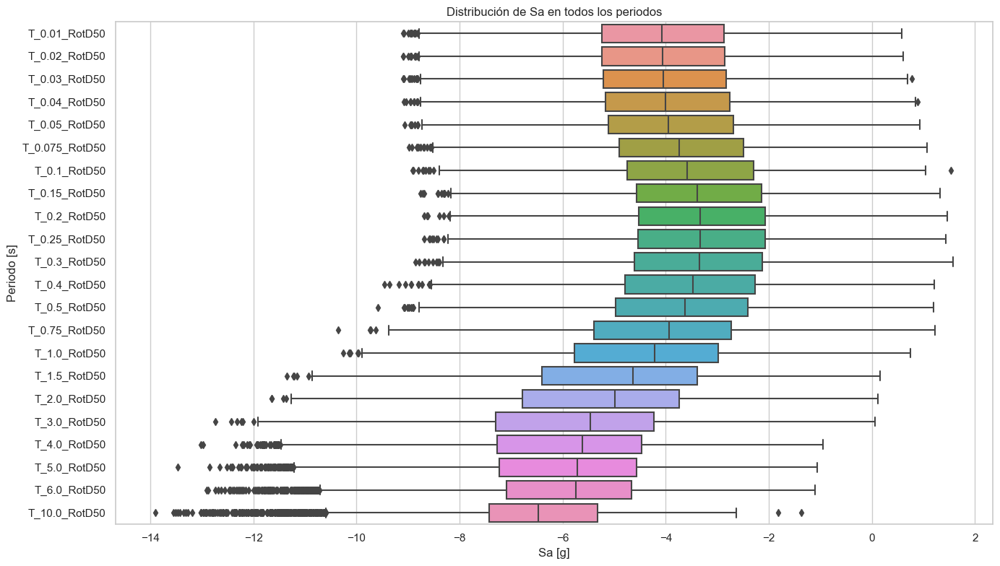

In [82]:
plt.figure(figsize=(14, 8))
sns.boxplot(data=df_total.filter(like="T_"), showfliers=True, orient="h")
plt.xlabel("Sa [g]")
plt.ylabel("Periodo [s]")
plt.title("Distribución de Sa en todos los periodos")
plt.tight_layout()
plt.show()


Si bien los boxplots de ln(Sa) aún muestran algunos registros fuera del rango de los bigotes, estos corresponden a valores legítimos en la cola de la distribución. Dado que ya se aplicaron filtros físicos (PGA > 1e-4 g) y estadísticos (±2σ), se decidió conservarlos como parte de la variabilidad natural de los registros, y podrían estar relacionados con la falta de información a periodos largos.

Para construir la matriz de correlación entre las variables predictoras y la variable de respuesta se usa la correlación de Spearman ya que ninguna de las predictoras sigue una distribución normal.

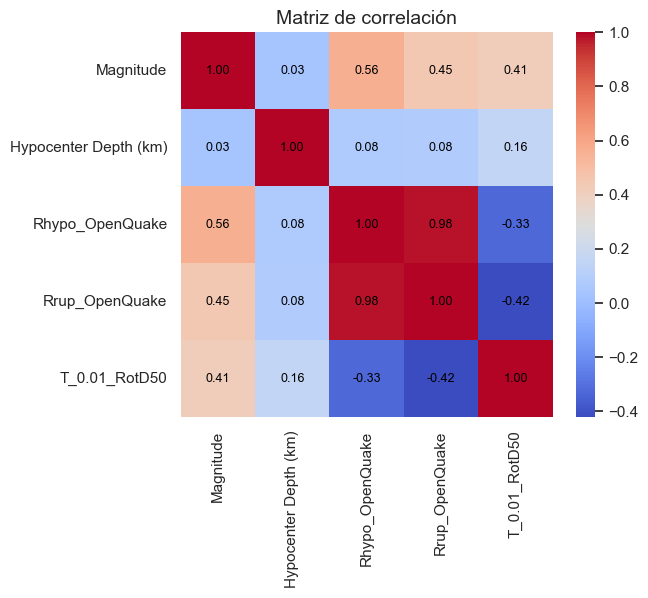

In [83]:
corr = df_total[['Magnitude','Hypocenter Depth (km)','Rhypo_OpenQuake','Rrup_OpenQuake','T_0.01_RotD50']].corr(method='spearman')

plt.figure(figsize=(6,5))
ax = sns.heatmap(corr, annot=False, cmap="coolwarm")

# Anotar manualmente
for i in range(len(corr)):
    for j in range(len(corr)):
        ax.text(j+0.5, i+0.5, f"{corr.iloc[i,j]:.2f}", 
                ha='center', va='center', color='black', fontsize=9)

plt.title("Matriz de correlación", fontsize=14)
plt.show()

Para el caso de las variables de predicción (el vector de aceleraciones espectrales Sa), se usa la correlación de pearson ya que se supone que son lognormales, es decir, el logaritmo de las aceleraciones sigue una distribución normal.

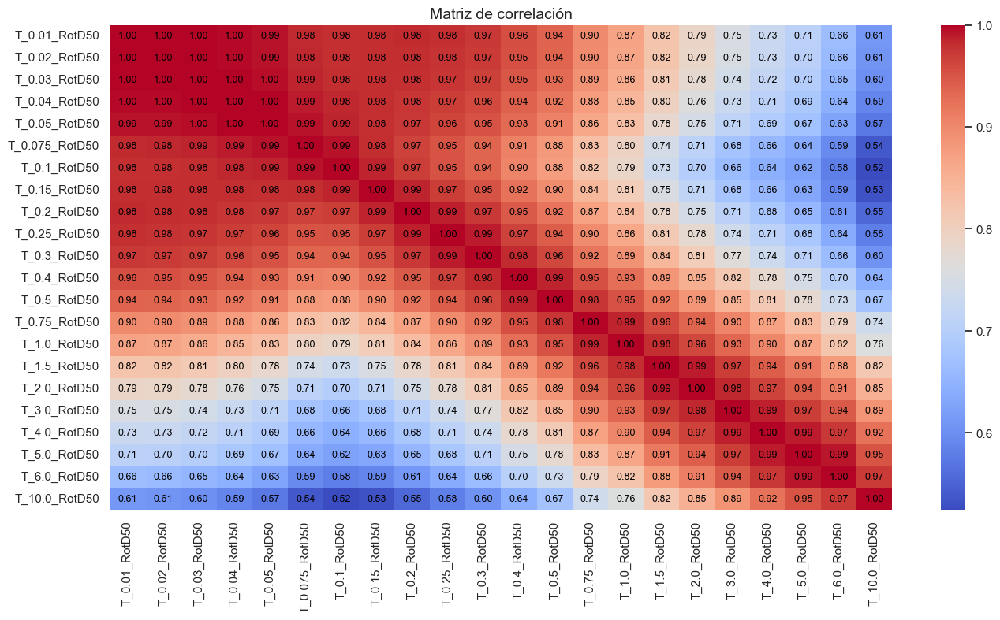

In [88]:
corr = df_total[outputs].corr(method='pearson')

plt.figure(figsize=(16,8))
ax = sns.heatmap(corr, annot=False, cmap="coolwarm")

# Anotar manualmente
for i in range(len(corr)):
    for j in range(len(corr)):
        ax.text(j+0.5, i+0.5, f"{corr.iloc[i,j]:.2f}", 
                ha='center', va='center', color='black', fontsize=9)

plt.title("Matriz de correlación", fontsize=14)
plt.show()


Se puede evidenciar que la variable respuesta que se quiere predecir (el vector de aceleraciones espectrales) tiene consigo una particularidad y es que todas las aceleraciones están correlacionadas fuertemente entre si, obteniendo valores entre 0.5 y 0.99. Esta correlación podría usarse como ventaja para aquellos modelos multioutput que reciban características como las independencias entre las variables de respuesta.

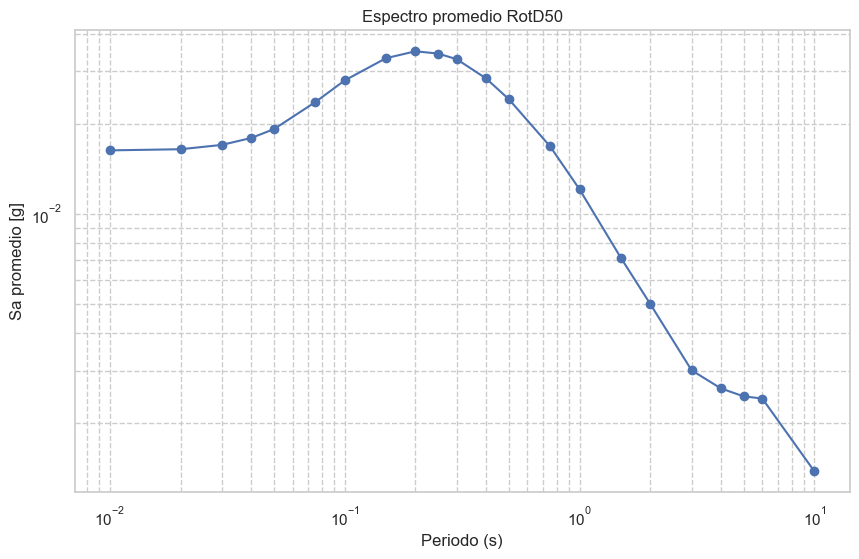

In [85]:

T = [float(c.split("_")[1]) for c in Sa_Crustal]
Sa_mean = np.exp(df_total[Sa_Crustal].mean())

plt.figure(figsize=(10,6))
plt.plot(T, Sa_mean, marker="o")
plt.xscale("log")
plt.yscale("log")
plt.xlabel("Periodo (s)")
plt.ylabel("Sa promedio [g]")
plt.title("Espectro promedio RotD50")
plt.grid(True, which="both", ls="--")
plt.show()